In [43]:
# Install Kaggle and Importing necessary libraries
!pip install kaggle

import json
import zipfile
import shutil
import random  # For random sampling
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
from tensorflow.keras.preprocessing import image  # For loading and processing images
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from sklearn.metrics import confusion_matrix, classification_report
import itertools


In [3]:
# Load Kaggle credentials from the saved JSON file
with open('kaggle.json') as file:
    kaggle_credentials = json.load(file)

# Set Kaggle username and key as environment variables
os.environ['KAGGLE_USERNAME'] = kaggle_credentials['username']
os.environ['KAGGLE_KEY'] = kaggle_credentials['key']

In [4]:
# Download the dataset
!kaggle datasets download -d vipoooool/new-plant-diseases-dataset
# Dataset source:https://www.kaggle.com/datasets/vipoooool/new-plant-diseases-dataset/data

Dataset URL: https://www.kaggle.com/datasets/vipoooool/new-plant-diseases-dataset
License(s): copyright-authors


In [5]:
# Creating a directory where we extract the dataset
dataset_folder = '/content/plant_disease_dataset'
os.makedirs(dataset_folder, exist_ok=True)

# Unzip the downloaded file into our target directory
with zipfile.ZipFile('new-plant-diseases-dataset.zip', 'r') as zip_ref:
    zip_ref.extractall(dataset_folder)


In [7]:

# Path to the wrong duplicate folder
wrong_folder = '/content/plant_disease_dataset/new plant diseases dataset(augmented)'

# Delete it
shutil.rmtree(wrong_folder)

print("Duplicate folder deleted successfully.")

Duplicate folder deleted successfully.


In [8]:
!ls

kaggle.json  new-plant-diseases-dataset.zip  plant_disease_dataset  sample_data


In [9]:
# Let's quickly check what files and folders are inside the extracted dataset
print(os.listdir('/content/plant_disease_dataset/New Plant Diseases Dataset(Augmented)'))

['New Plant Diseases Dataset(Augmented)']


In [10]:
# lets Setting up the base paths for training and validation datasets
train_dir = '/content/plant_disease_dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train'
valid_dir = '/content/plant_disease_dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/valid'


In [11]:
# Let's list out all the classes (folders) available in the training set
train_classes = os.listdir(train_dir)

# Printing how many different classes we have
print(f"Total number of classes in the training set: {len(train_classes)}")

# Just checking a few sample class names to get an idea
print("Sample class names:", train_classes[:5])


Total number of classes in the training set: 38
Sample class names: ['Pepper,_bell___healthy', 'Orange___Haunglongbing_(Citrus_greening)', 'Apple___Apple_scab', 'Tomato___Target_Spot', 'Peach___healthy']


**EDA**

In [12]:
# Now, let's see how many images we have for each class in the training set
class_counts = {cls: len(os.listdir(os.path.join(train_dir, cls))) for cls in train_classes}

print("\nNumber of images per class:")
for cls, count in class_counts.items():
    print(f"{cls}: {count}")



Number of images per class:
Pepper,_bell___healthy: 1988
Orange___Haunglongbing_(Citrus_greening): 2010
Apple___Apple_scab: 2016
Tomato___Target_Spot: 1827
Peach___healthy: 1728
Grape___Black_rot: 1888
Apple___healthy: 2008
Tomato___healthy: 1926
Tomato___Septoria_leaf_spot: 1745
Raspberry___healthy: 1781
Squash___Powdery_mildew: 1736
Tomato___Tomato_Yellow_Leaf_Curl_Virus: 1961
Strawberry___healthy: 1824
Potato___Early_blight: 1939
Potato___Late_blight: 1939
Peach___Bacterial_spot: 1838
Potato___healthy: 1824
Cherry_(including_sour)___Powdery_mildew: 1683
Pepper,_bell___Bacterial_spot: 1913
Blueberry___healthy: 1816
Cherry_(including_sour)___healthy: 1826
Apple___Cedar_apple_rust: 1760
Strawberry___Leaf_scorch: 1774
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot: 1642
Tomato___Early_blight: 1920
Tomato___Spider_mites Two-spotted_spider_mite: 1741
Corn_(maize)___healthy: 1859
Tomato___Leaf_Mold: 1882
Grape___Leaf_blight_(Isariopsis_Leaf_Spot): 1722
Corn_(maize)___Common_rust_: 190

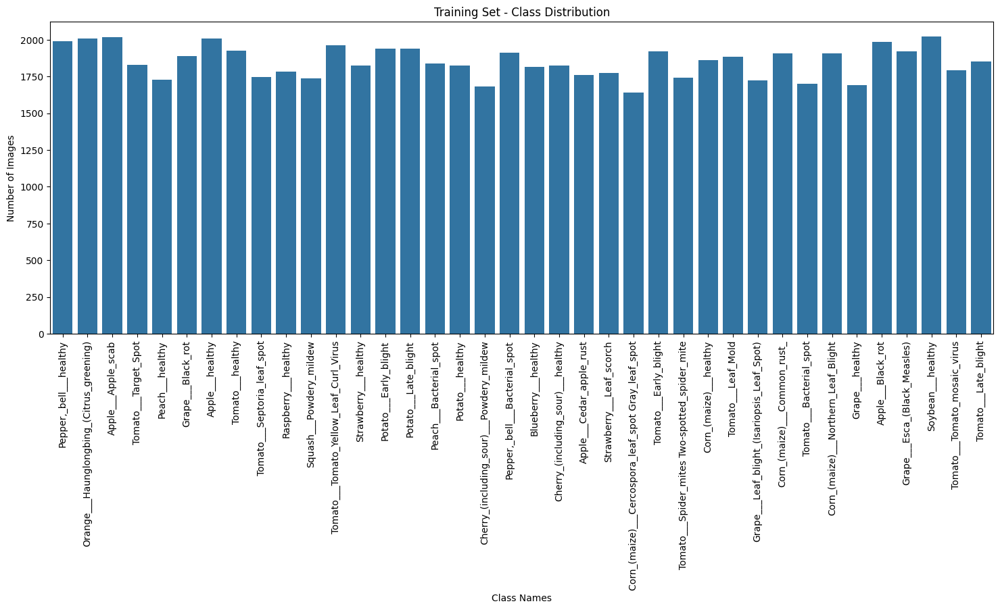

In [13]:
# Let's plot the class distribution to get a visual idea
plt.figure(figsize=(18, 6))
sns.barplot(x=list(class_counts.keys()), y=list(class_counts.values()))

# Rotating x-axis labels for better readability
plt.xticks(rotation=90)

# Adding a title and labels to make the plot clear
plt.title('Training Set - Class Distribution')
plt.xlabel('Class Names')
plt.ylabel('Number of Images')

# Finally, displaying the plot
plt.show()


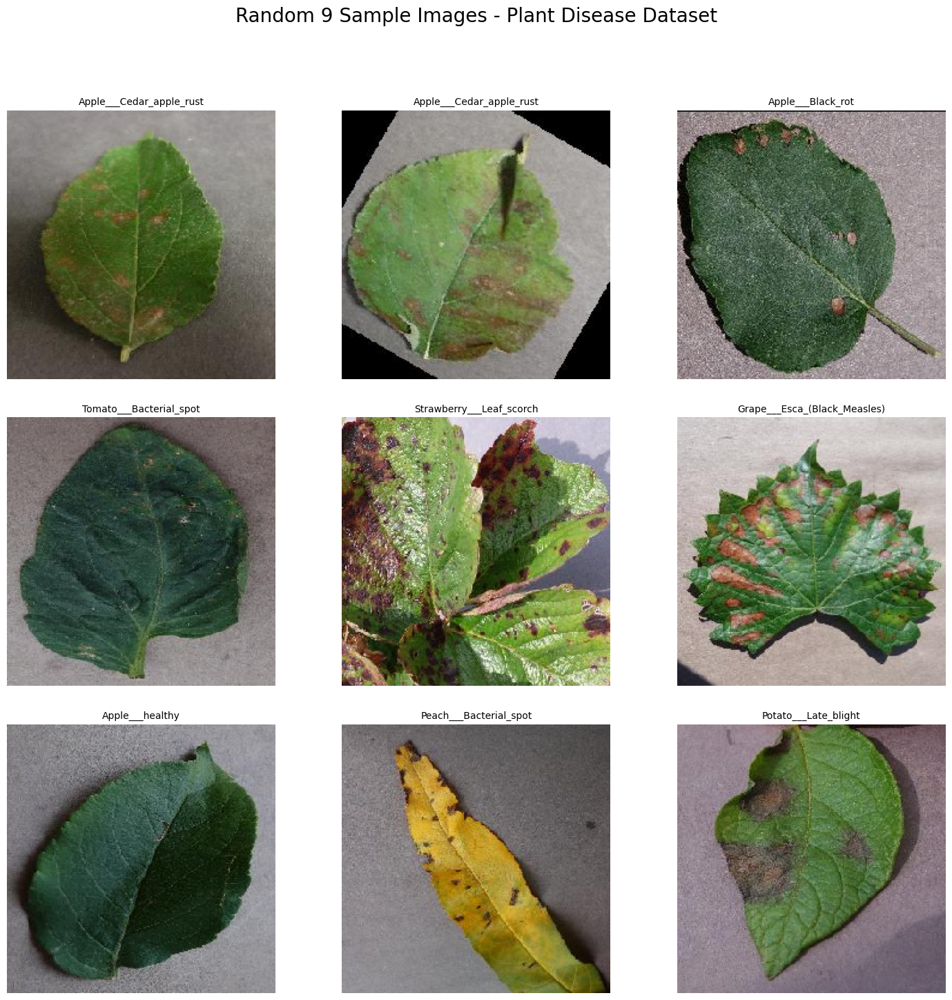

In [16]:
# Let's display some random sample images from the training set to get a feel for the dataset


# try to gather all the image paths along with their class names
train_classes = os.listdir(train_dir)
all_image_paths = []

for cls in train_classes:
    cls_folder = os.path.join(train_dir, cls)
    for img_file in os.listdir(cls_folder):
        all_image_paths.append((os.path.join(cls_folder, img_file), cls))

# Randomly pick 9 images to visualize
random_samples = random.sample(all_image_paths, 9)

# Set up a 3x3 grid for displaying the images
plt.figure(figsize=(15, 15))

for idx, (img_path, cls_name) in enumerate(random_samples):
    img = image.load_img(img_path, target_size=(224, 224))
    plt.subplot(3, 3, idx + 1)
    plt.imshow(img)
    plt.title(cls_name, fontsize=10)
    plt.axis('off')  # Hide axes for cleaner look

# Adjust layout so titles don't overlap
plt.tight_layout(pad=3.0)

# Add a main title above all images
plt.subplots_adjust(top=0.88)
plt.suptitle('Random 9 Sample Images - Plant Disease Dataset', fontsize=20)
plt.show()


It shows:

The variety of different plant disease classes,

The real image quality from the dataset,

Random 9 Sample Images - Plant Disease Dataset.



--------------------Train vs Validation set class distruction chart:-


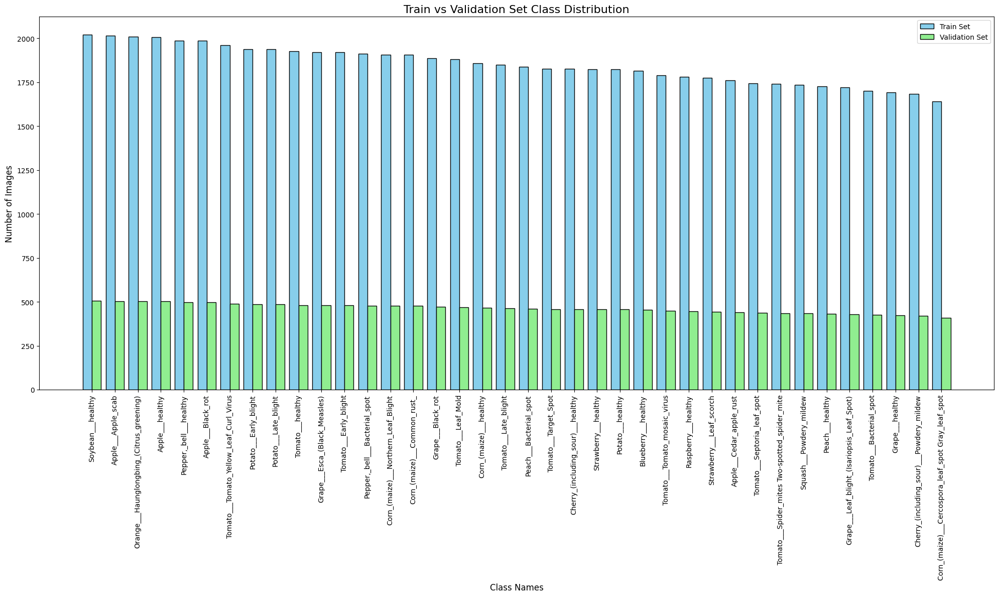

In [17]:
# Setting up the paths for training and validation datasets
train_dir = '/content/plant_disease_dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train'
valid_dir = '/content/plant_disease_dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/valid'

# Let's count the number of images per class in both training and validation sets
train_counts = {cls: len(os.listdir(os.path.join(train_dir, cls))) for cls in os.listdir(train_dir)}
valid_counts = {cls: len(os.listdir(os.path.join(valid_dir, cls))) for cls in os.listdir(valid_dir)}

# Now, converting the counts into a DataFrame for easier visualization
df_counts = pd.DataFrame({
    'Class': list(train_counts.keys()),
    'Train Images': list(train_counts.values()),
    'Validation Images': [valid_counts.get(cls, 0) for cls in train_counts.keys()]  # Just in case a class is missing
})

# Let's sort the DataFrame based on the number of training images (makes the plot cleaner)
df_counts_sorted = df_counts.sort_values('Train Images', ascending=False)

# Plotting the class distribution for both train and validation sets
plt.figure(figsize=(20, 12))
bar_width = 0.4

r1 = range(len(df_counts_sorted))
r2 = [x + bar_width for x in r1]  # Offset for validation bars

# Create side-by-side bars
plt.bar(r1, df_counts_sorted['Train Images'], width=bar_width, label='Train Set', color='skyblue', edgecolor='black')
plt.bar(r2, df_counts_sorted['Validation Images'], width=bar_width, label='Validation Set', color='lightgreen', edgecolor='black')

# Adding labels and title
plt.xlabel('Class Names', fontsize=12)
plt.ylabel('Number of Images', fontsize=12)
plt.title('Train vs Validation Set Class Distribution', fontsize=16)

# Setting x-ticks to be between the two bars
plt.xticks([r + bar_width/2 for r in range(len(df_counts_sorted))], df_counts_sorted['Class'], rotation=90)

# Adding a legend to differentiate
plt.legend()

# Adjust layout to prevent label cutoff
plt.tight_layout()

# Finally, show the plot
plt.show()


**-------------------------------- Class imbalance check chart**

<ipython-input-18-b7467519e1e7>:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=train_counts_df_sorted, x='Number of Images', y='Class', palette='viridis')


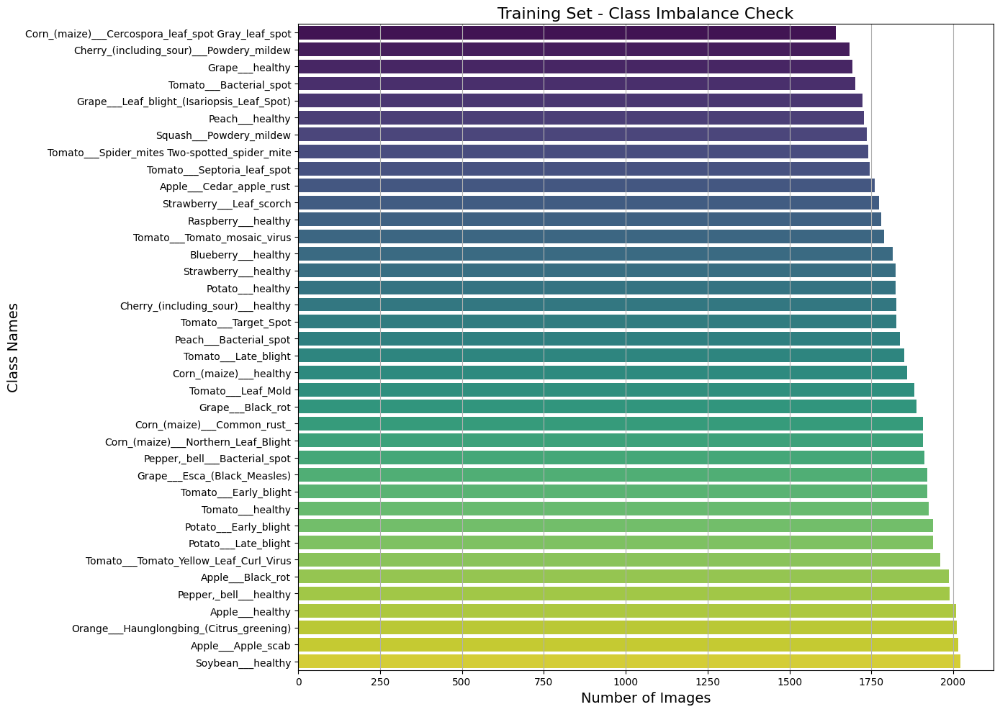

In [18]:
#
# Setting the training directory path
train_dir = '/content/plant_disease_dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train'

# Counting the number of images for each class
train_counts = {cls: len(os.listdir(os.path.join(train_dir, cls))) for cls in os.listdir(train_dir)}

# Converting the counts dictionary into a DataFrame for easier plotting
train_counts_df = pd.DataFrame(list(train_counts.items()), columns=['Class', 'Number of Images'])

# Sorting classes by the number of images (ascending) to spot imbalances easily
train_counts_df_sorted = train_counts_df.sort_values('Number of Images', ascending=True)

# Plotting the number of images per class
plt.figure(figsize=(14, 10))
sns.barplot(data=train_counts_df_sorted, x='Number of Images', y='Class', palette='viridis')

# Adding title and axis labels
plt.title('Training Set - Class Imbalance Check', fontsize=16)
plt.xlabel('Number of Images', fontsize=14)
plt.ylabel('Class Names', fontsize=14)

# Adding a grid along x-axis for better visual alignment
plt.grid(axis='x')

# Adjust layout to make sure everything fits nicely
plt.tight_layout()

# Show the plot
plt.show()


**Data Agmentation**

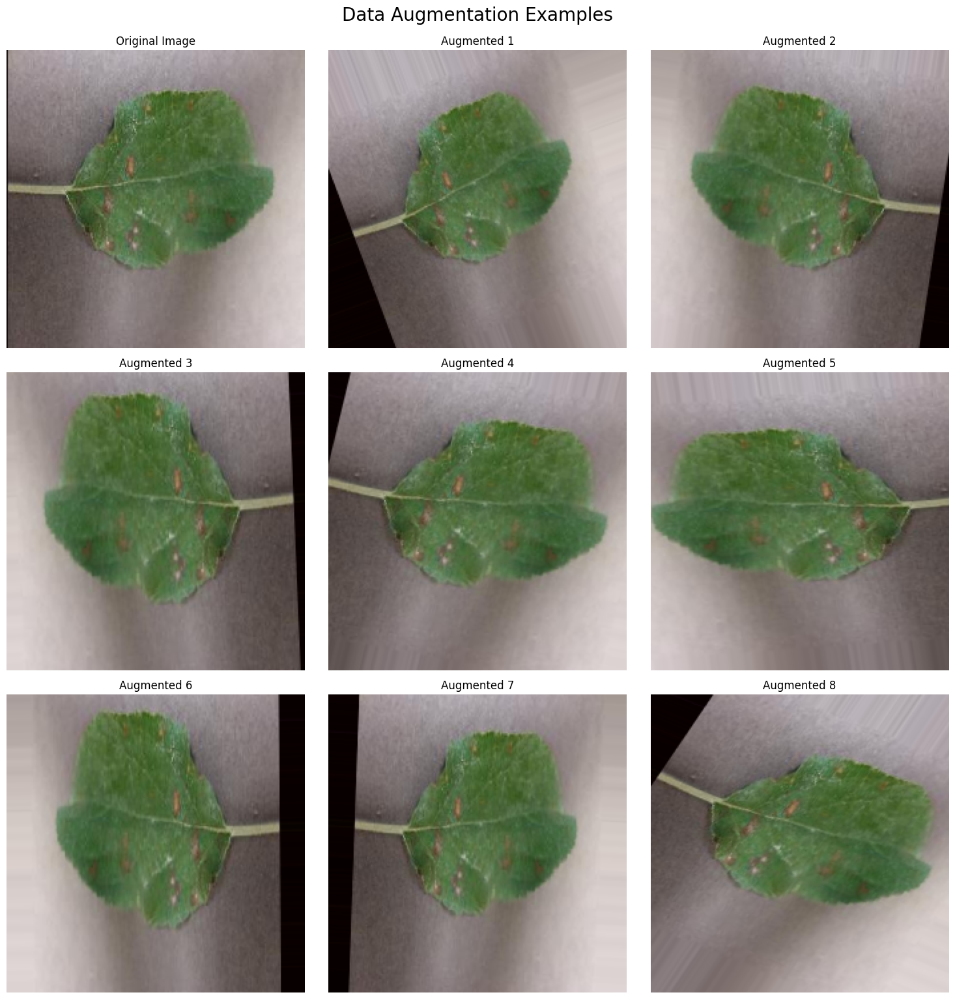

In [21]:
# Let's define a simple ImageDataGenerator with some basic augmentations
augmenter = ImageDataGenerator(
    rescale=1./255,
    rotation_range=30,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Randomly pick an image from the training set to visualize augmentations
train_dir = '/content/plant_disease_dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train'
random_class = random.choice(os.listdir(train_dir))
random_img_path = os.path.join(train_dir, random_class, random.choice(os.listdir(os.path.join(train_dir, random_class))))

# Load and preprocess the selected image
img = load_img(random_img_path, target_size=(224, 224))  # Resizing to match model input size
img_array = img_to_array(img)
img_array = img_array.reshape((1,) + img_array.shape)  # Reshape to feed into the augmenter

# Generate augmented images
aug_iter = augmenter.flow(img_array, batch_size=1)

# Let's plot the original image along with 8 augmented versions
plt.figure(figsize=(15, 15))

# Display the original image
plt.subplot(3, 3, 1)
plt.imshow(img)
plt.title('Original Image')
plt.axis('off')

# Display 8 augmented images
for i in range(2, 10):
    aug_img = next(aug_iter)[0]
    plt.subplot(3, 3, i)
    plt.imshow(aug_img)
    plt.title(f'Augmented {i-1}')
    plt.axis('off')

# Adjust layout and add a main title
plt.tight_layout()
plt.suptitle('Data Augmentation Examples', fontsize=20, y=1.02)
plt.show()

----------------------------------                                          **RGB Color Channel Analysis of Sample Images**
----------------------------------

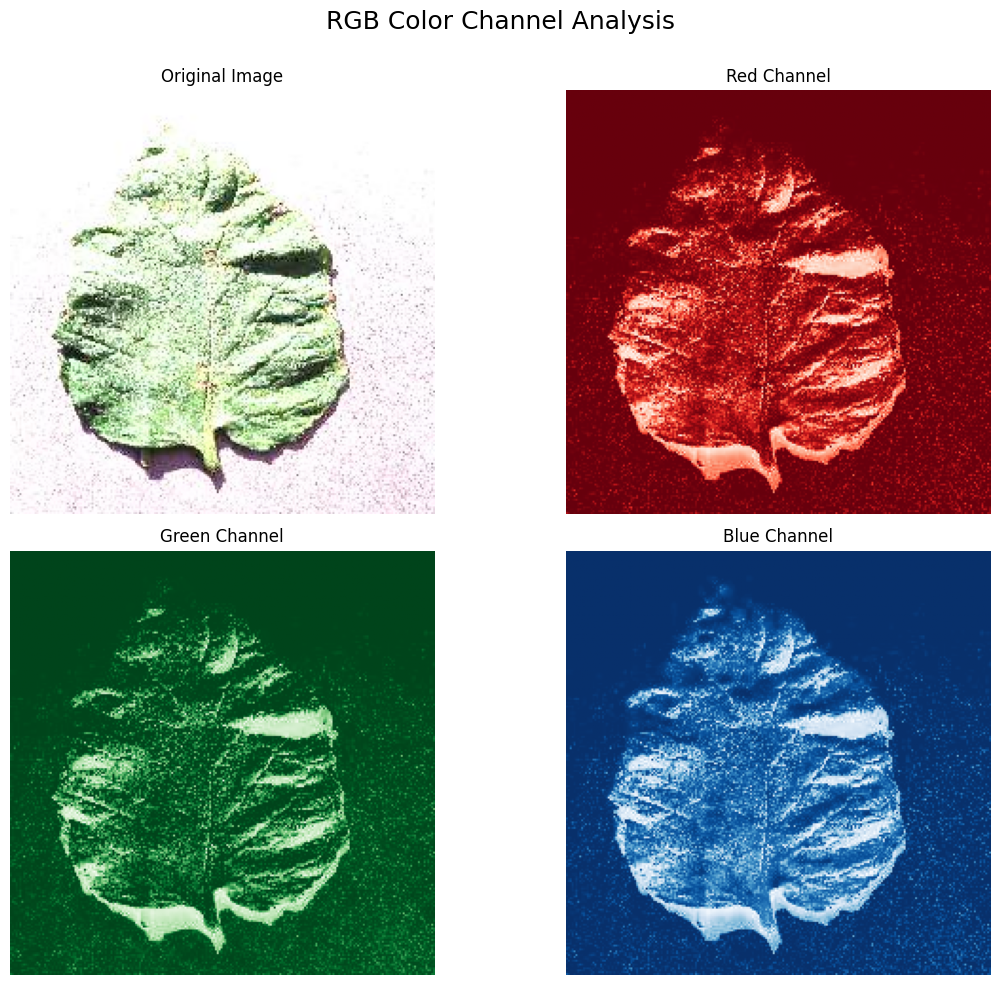

In [22]:
# Let's pick a random image from the training set for RGB channel analysis
train_dir = '/content/plant_disease_dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train'
random_class = random.choice(os.listdir(train_dir))
random_img_path = os.path.join(train_dir, random_class, random.choice(os.listdir(os.path.join(train_dir, random_class))))

# Load the selected image and resize it to (224, 224)
img = load_img(random_img_path, target_size=(224, 224))
img_array = img_to_array(img) / 255.0  # Normalize pixel values to [0,1] range

# Split the image into Red, Green, and Blue channels
R = img_array[:, :, 0]
G = img_array[:, :, 1]
B = img_array[:, :, 2]

# Plotting the original image along with its R, G, B channels
plt.figure(figsize=(12, 10))

# Display original image
plt.subplot(2, 2, 1)
plt.imshow(img_array)
plt.title('Original Image')
plt.axis('off')

# Display Red channel
plt.subplot(2, 2, 2)
plt.imshow(R, cmap='Reds')
plt.title('Red Channel')
plt.axis('off')

# Display Green channel
plt.subplot(2, 2, 3)
plt.imshow(G, cmap='Greens')
plt.title('Green Channel')
plt.axis('off')

# Display Blue channel
plt.subplot(2, 2, 4)
plt.imshow(B, cmap='Blues')
plt.title('Blue Channel')
plt.axis('off')

# Add a main title and adjust layout
plt.suptitle('RGB Color Channel Analysis', fontsize=18)
plt.tight_layout()
plt.subplots_adjust(top=0.9)
plt.show()


**Loading and Preparing Training, Validation, and Test Datasets**

In [23]:
# Define the paths for training, validation, and test datasets
train_dir = '/content/plant_disease_dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train'
valid_dir = '/content/plant_disease_dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/valid'
test_dir = '/content/plant_disease_dataset/test'  # Assuming the test set is organized correctly

# Load the training dataset
training_set = tf.keras.utils.image_dataset_from_directory(
    train_dir,
    labels='inferred',             # Automatically use folder names as labels
    label_mode='categorical',       # One-hot encode the labels
    batch_size=32,                  # Number of images per batch
    image_size=(128, 128),           # Resize images to 128x128
    shuffle=True                    # Shuffle the dataset for better training
)

# Load the validation dataset
validation_set = tf.keras.utils.image_dataset_from_directory(
    valid_dir,
    labels='inferred',
    label_mode='categorical',
    batch_size=32,
    image_size=(128, 128),
    shuffle=True
)

# Load the test dataset
# Note: Shuffling is set to False to maintain the original order during evaluation
test_set = tf.keras.utils.image_dataset_from_directory(
    test_dir,
    labels='inferred',
    label_mode='categorical',
    batch_size=32,
    image_size=(128, 128),
    shuffle=False
)

Found 70295 files belonging to 38 classes.
Found 17572 files belonging to 38 classes.
Found 33 files belonging to 1 classes.


In [24]:
# Let's quickly check how many classes we have and what they are
print(f"Total number of classes: {len(training_set.class_names)}")
print(f"Class labels: {training_set.class_names}")


Total number of classes: 38
Class labels: ['Apple___Apple_scab', 'Apple___Black_rot', 'Apple___Cedar_apple_rust', 'Apple___healthy', 'Blueberry___healthy', 'Cherry_(including_sour)___Powdery_mildew', 'Cherry_(including_sour)___healthy', 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot', 'Corn_(maize)___Common_rust_', 'Corn_(maize)___Northern_Leaf_Blight', 'Corn_(maize)___healthy', 'Grape___Black_rot', 'Grape___Esca_(Black_Measles)', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Grape___healthy', 'Orange___Haunglongbing_(Citrus_greening)', 'Peach___Bacterial_spot', 'Peach___healthy', 'Pepper,_bell___Bacterial_spot', 'Pepper,_bell___healthy', 'Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy', 'Raspberry___healthy', 'Soybean___healthy', 'Squash___Powdery_mildew', 'Strawberry___Leaf_scorch', 'Strawberry___healthy', 'Tomato___Bacterial_spot', 'Tomato___Early_blight', 'Tomato___Late_blight', 'Tomato___Leaf_Mold', 'Tomato___Septoria_leaf_spot', 'Tomato___Spider_mites Two

In [25]:
# Let's take a quick look at one batch from the training set
for x_batch, y_batch in training_set.take(1):
    print("Batch image shape:", x_batch.shape)
    print("Batch label shape:", y_batch.shape)


Batch image shape: (32, 128, 128, 3)
Batch label shape: (32, 38)


In [26]:
# Just checking one full batch to understand the structure of images and labels
for x, y in training_set:
    print(x)
    print("Image batch shape:", x.shape)
    print(y)
    print("Label batch shape:", y.shape)
    break  # Only checking the first batch


tf.Tensor(
[[[[113.25 106.25 114.25]
   [125.25 118.25 126.25]
   [127.   120.   128.  ]
   ...
   [ 84.    75.    80.  ]
   [ 82.25  73.25  78.25]
   [ 86.25  77.25  82.25]]

  [[149.   142.   150.  ]
   [139.5  132.5  140.5 ]
   [119.5  112.5  120.5 ]
   ...
   [ 87.25  78.25  83.25]
   [ 84.25  75.25  80.25]
   [ 84.    75.    80.  ]]

  [[121.75 114.75 122.75]
   [142.5  135.5  143.5 ]
   [137.25 130.25 138.25]
   ...
   [ 92.    83.    88.  ]
   [ 91.25  82.25  87.25]
   [ 80.25  71.25  76.25]]

  ...

  [[204.25 199.25 203.25]
   [194.75 189.75 193.75]
   [197.5  192.5  196.5 ]
   ...
   [171.   165.   169.  ]
   [166.75 160.75 164.75]
   [158.   152.   156.  ]]

  [[206.5  201.5  205.5 ]
   [200.5  195.5  199.5 ]
   [195.25 190.25 194.25]
   ...
   [158.75 152.75 156.75]
   [161.25 155.25 159.25]
   [163.5  157.5  161.5 ]]

  [[208.   203.   207.  ]
   [197.   192.   196.  ]
   [203.25 198.25 202.25]
   ...
   [173.25 167.25 171.25]
   [174.25 168.25 172.25]
   [180.25 174.25 17

**#Lets Build a model**

In [27]:
# Import necessary libraries
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam

# Initialize a sequential model
model = Sequential()

# First convolutional block
model.add(Conv2D(filters=32, kernel_size=(3,3), activation='relu', padding='same', input_shape=(128,128,3)))
model.add(Conv2D(filters=32, kernel_size=(3,3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2,2), strides=2))

# Second convolutional block
model.add(Conv2D(filters=64, kernel_size=(3,3), activation='relu', padding='same'))
model.add(Conv2D(filters=64, kernel_size=(3,3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2,2), strides=2))

# Third convolutional block
model.add(Conv2D(filters=128, kernel_size=(3,3), activation='relu', padding='same'))
model.add(Conv2D(filters=128, kernel_size=(3,3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2,2), strides=2))

# Fourth convolutional block
model.add(Conv2D(filters=256, kernel_size=(3,3), activation='relu', padding='same'))
model.add(Conv2D(filters=256, kernel_size=(3,3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2,2), strides=2))

# Fifth convolutional block
model.add(Conv2D(filters=512, kernel_size=(3,3), activation='relu', padding='same'))
model.add(Conv2D(filters=512, kernel_size=(3,3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2,2), strides=2))

# Dropout layer to reduce overfitting
model.add(Dropout(0.25))

# Flatten the output from convolutional blocks
model.add(Flatten())

# Fully connected dense layer
model.add(Dense(units=1500, activation='relu'))

# Additional dropout layer
model.add(Dropout(0.4))

# Output layer with softmax activation (38 classes)
model.add(Dense(units=38, activation='softmax'))

# Compile model with Adam optimizer
model.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Display model architecture summary
model.summary()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 128, 128, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 126, 126, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 63, 63, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 63, 63, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 61, 61, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 30, 30, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 30, 30, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 28, 28, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 14, 14, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 14, 14, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 12, 12, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 6, 6, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 6, 6, 512)      │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 4, 4, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 2, 2, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 2, 2, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1500)           │     3,073,500 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 1500)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 38)             │        57,038 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,842,762 (29.92 MB)

 Trainable params: 7,842,762 (29.92 MB)

 Non-trainable params: 0 (0.00 B)

In [29]:
# Import necessary callbacks
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define EarlyStopping callback to stop training if validation loss doesn't improve
early_stop = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True,
    verbose=1
)

# Define ModelCheckpoint callback to save the best model during training
checkpoint = ModelCheckpoint(
    'best_plant_disease_model.h5',  # file path to save the model
    monitor='val_loss',
    save_best_only=True,
    verbose=1
)

# Train the model with defined callbacks
history = model.fit(
    training_set,                  # previously prepared training set
    epochs=10,                     # number of epochs (adjustable)
    validation_data=validation_set,  # previously prepared validation set
    callbacks=[early_stop, checkpoint]
)

Epoch 1/10
2197/2197 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - accuracy: 0.4154 - loss: 2.0415
Epoch 1: val_loss improved from inf to 0.50242, saving model to best_plant_disease_model.h5


2197/2197 ━━━━━━━━━━━━━━━━━━━━ 154s 70ms/step - accuracy: 0.4155 - loss: 2.0411 - val_accuracy: 0.8411 - val_loss: 0.5024
Epoch 2/10
2196/2197 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - accuracy: 0.8430 - loss: 0.4998
Epoch 2: val_loss improved from 0.50242 to 0.28424, saving model to best_plant_disease_model.h5


2197/2197 ━━━━━━━━━━━━━━━━━━━━ 183s 61ms/step - accuracy: 0.8430 - loss: 0.4997 - val_accuracy: 0.9063 - val_loss: 0.2842
Epoch 3/10
2196/2197 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - accuracy: 0.9075 - loss: 0.2868
Epoch 3: val_loss improved from 0.28424 to 0.18145, saving model to best_plant_disease_model.h5


2197/2197 ━━━━━━━━━━━━━━━━━━━━ 134s 61ms/step - accuracy: 0.9075 - loss: 0.2868 - val_accuracy: 0.9421 - val_loss: 0.1815
Epoch 4/10
2196/2197 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - accuracy: 0.9360 - loss: 0.1953
Epoch 4: val_loss did not improve from 0.18145
2197/2197 ━━━━━━━━━━━━━━━━━━━━ 133s 61ms/step - accuracy: 0.9360 - loss: 0.1953 - val_accuracy: 0.9366 - val_loss: 0.1979
Epoch 5/10
2196/2197 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - accuracy: 0.9530 - loss: 0.1437
Epoch 5: val_loss improved from 0.18145 to 0.13579, saving model to best_plant_disease_model.h5


2197/2197 ━━━━━━━━━━━━━━━━━━━━ 152s 65ms/step - accuracy: 0.9530 - loss: 0.1437 - val_accuracy: 0.9572 - val_loss: 0.1358
Epoch 6/10
2196/2197 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - accuracy: 0.9628 - loss: 0.1103
Epoch 6: val_loss improved from 0.13579 to 0.12327, saving model to best_plant_disease_model.h5


2197/2197 ━━━━━━━━━━━━━━━━━━━━ 134s 61ms/step - accuracy: 0.9628 - loss: 0.1103 - val_accuracy: 0.9630 - val_loss: 0.1233
Epoch 7/10
2196/2197 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - accuracy: 0.9697 - loss: 0.0926
Epoch 7: val_loss did not improve from 0.12327
2197/2197 ━━━━━━━━━━━━━━━━━━━━ 132s 60ms/step - accuracy: 0.9697 - loss: 0.0926 - val_accuracy: 0.9616 - val_loss: 0.1310
Epoch 8/10
2196/2197 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - accuracy: 0.9761 - loss: 0.0752
Epoch 8: val_loss improved from 0.12327 to 0.12049, saving model to best_plant_disease_model.h5


2197/2197 ━━━━━━━━━━━━━━━━━━━━ 145s 62ms/step - accuracy: 0.9761 - loss: 0.0752 - val_accuracy: 0.9645 - val_loss: 0.1205
Epoch 9/10
2196/2197 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - accuracy: 0.9789 - loss: 0.0673
Epoch 9: val_loss improved from 0.12049 to 0.11435, saving model to best_plant_disease_model.h5


2197/2197 ━━━━━━━━━━━━━━━━━━━━ 144s 65ms/step - accuracy: 0.9789 - loss: 0.0673 - val_accuracy: 0.9674 - val_loss: 0.1144
Epoch 10/10
2196/2197 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - accuracy: 0.9810 - loss: 0.0592
Epoch 10: val_loss did not improve from 0.11435
2197/2197 ━━━━━━━━━━━━━━━━━━━━ 144s 66ms/step - accuracy: 0.9810 - loss: 0.0592 - val_accuracy: 0.9653 - val_loss: 0.1163
Restoring model weights from the end of the best epoch: 9.


In [30]:
#Model Evaluation on Training set
train_loss,train_acc = model.evaluate(training_set)

2197/2197 ━━━━━━━━━━━━━━━━━━━━ 45s 21ms/step - accuracy: 0.9906 - loss: 0.0295


In [31]:
# Print the training loss and accuracy
print(train_loss, train_acc)

0.02652331069111824 0.9915499091148376


In [32]:
# Evaluate model on validation set
val_loss, val_acc = model.evaluate(validation_set)

# Print results
print(f"\nValidation Loss: {val_loss:.4f}")
print(f"Validation Accuracy: {val_acc:.4f}")

550/550 ━━━━━━━━━━━━━━━━━━━━ 11s 21ms/step - accuracy: 0.9692 - loss: 0.1054

Validation Loss: 0.1144
Validation Accuracy: 0.9674


**Plotting the curves**

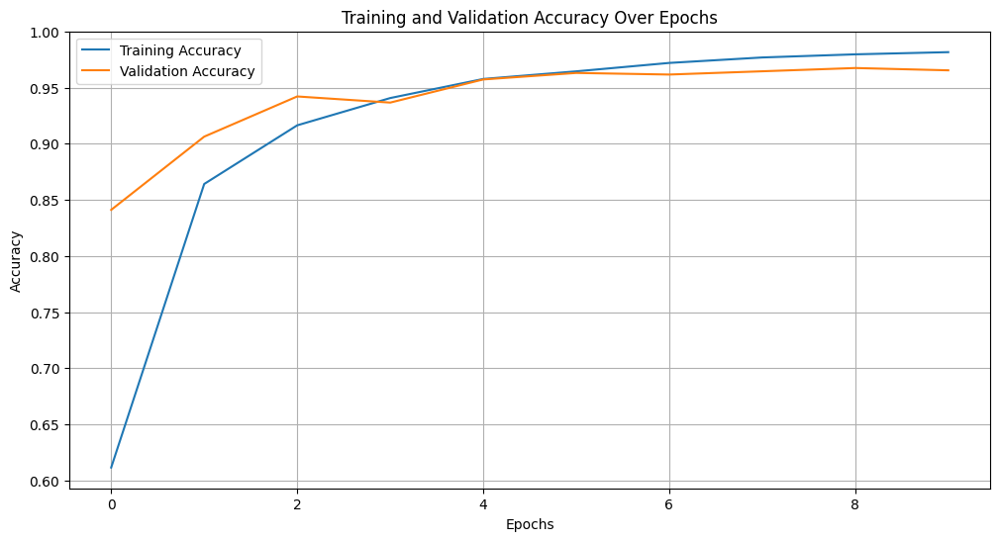

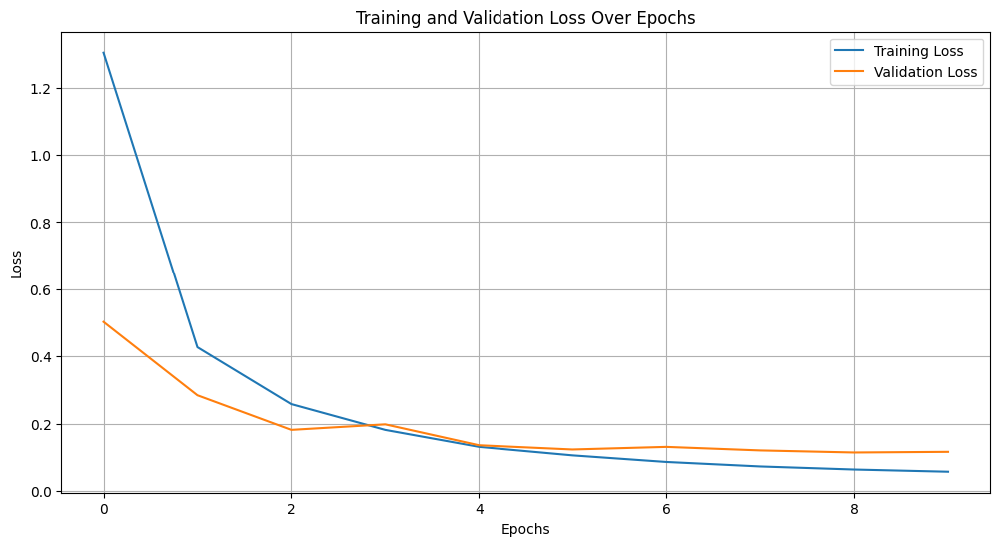

In [33]:

# Plot Training and Validation Accuracy
plt.figure(figsize=(12, 6))
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()

# Plot Training and Validation Loss
plt.figure(figsize=(12, 6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()


In [34]:
# Prepare test dataset
test_set = tf.keras.utils.image_dataset_from_directory(
    '/content/plant_disease_dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/valid',
    labels="inferred",
    label_mode="categorical",
    color_mode="rgb",
    batch_size=32,
    image_size=(128, 128),
    shuffle=False
)



Found 17572 files belonging to 38 classes.


In [35]:
y_pred = model.predict(test_set)
y_pred,y_pred.shape

550/550 ━━━━━━━━━━━━━━━━━━━━ 18s 32ms/step


(array([[9.9999917e-01, 2.2059812e-07, 1.4200242e-09, ..., 8.5697152e-15,
         1.9070056e-14, 4.6889432e-15],
        [9.9985898e-01, 1.5560190e-05, 1.1936156e-07, ..., 1.1519354e-11,
         2.0598627e-11, 2.2454006e-11],
        [1.0000000e+00, 9.9595674e-09, 4.3267789e-10, ..., 2.7159559e-18,
         2.8214706e-15, 2.6846868e-15],
        ...,
        [7.1137696e-10, 2.0198272e-11, 1.6936897e-09, ..., 3.8727667e-11,
         2.0282432e-11, 9.9999559e-01],
        [6.6402577e-09, 6.1500284e-12, 8.1737145e-10, ..., 9.0226923e-11,
         1.6536996e-11, 9.9999928e-01],
        [1.2578116e-16, 3.7067690e-17, 6.2513439e-18, ..., 1.1624715e-20,
         4.9688003e-18, 1.0000000e+00]], dtype=float32),
 (17572, 38))

In [36]:
predicted_categories = tf.argmax(y_pred,axis=1)
predicted_categories

<tf.Tensor: shape=(17572,), dtype=int64, numpy=array([ 0,  0,  0, ..., 37, 37, 37])>

In [37]:
true_categories = tf.concat([y for x,y in test_set],axis=0)
true_categories

<tf.Tensor: shape=(17572, 38), dtype=float32, numpy=
array([[1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.]], dtype=float32)>

In [38]:
Y_true = tf.argmax(true_categories,axis=1)
Y_true

<tf.Tensor: shape=(17572,), dtype=int64, numpy=array([ 0,  0,  0, ..., 37, 37, 37])>

In [39]:
from sklearn.metrics import classification_report,confusion_matrix

In [40]:
# Generate and print classification report
print(classification_report(Y_true, predicted_categories, target_names=list(training_set.class_names)))


                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       0.97      0.93      0.95       504
                                 Apple___Black_rot       0.98      0.99      0.98       497
                          Apple___Cedar_apple_rust       0.99      0.96      0.97       440
                                   Apple___healthy       0.96      0.98      0.97       502
                               Blueberry___healthy       0.96      0.98      0.97       454
          Cherry_(including_sour)___Powdery_mildew       0.99      0.97      0.98       421
                 Cherry_(including_sour)___healthy       0.97      0.99      0.98       456
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.97      0.90      0.93       410
                       Corn_(maize)___Common_rust_       0.94      1.00      0.97       477
               Corn_(maize)___Northern_Leaf_Blight       0.96      0.97      0.

550/550 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step
                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       0.97      0.93      0.95       504
                                 Apple___Black_rot       0.98      0.99      0.98       497
                          Apple___Cedar_apple_rust       0.99      0.96      0.97       440
                                   Apple___healthy       0.96      0.98      0.97       502
                               Blueberry___healthy       0.96      0.98      0.97       454
          Cherry_(including_sour)___Powdery_mildew       0.99      0.97      0.98       421
                 Cherry_(including_sour)___healthy       0.97      0.99      0.98       456
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.97      0.90      0.93       410
                       Corn_(maize)___Common_rust_       0.94      1.00      0.97       477
               Corn_(maize)___Northe

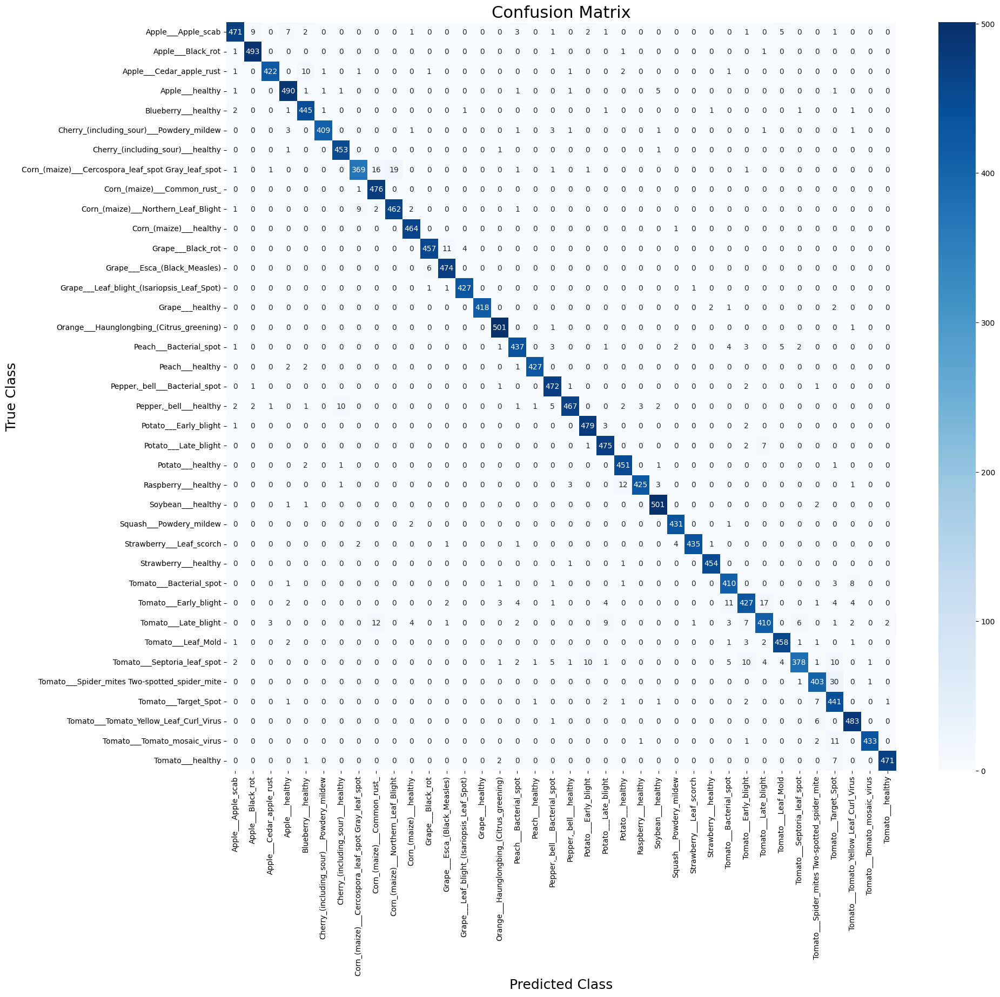

In [41]:
# Predict classes on the test set
y_pred = model.predict(test_set)
y_pred_classes = np.argmax(y_pred, axis=1)

# Extract true labels
y_true = np.concatenate([y for x, y in test_set], axis=0)
y_true_classes = np.argmax(y_true, axis=1)

# Class names
class_names = list(test_set.class_names)

# Generate and print classification report
print(classification_report(y_true_classes, y_pred_classes, target_names=class_names))

# Compute and plot confusion matrix
cm = confusion_matrix(y_true_classes, y_pred_classes)
plt.figure(figsize=(20,18))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix', fontsize=22)
plt.xlabel('Predicted Class', fontsize=18)
plt.ylabel('True Class', fontsize=18)
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 808ms/step


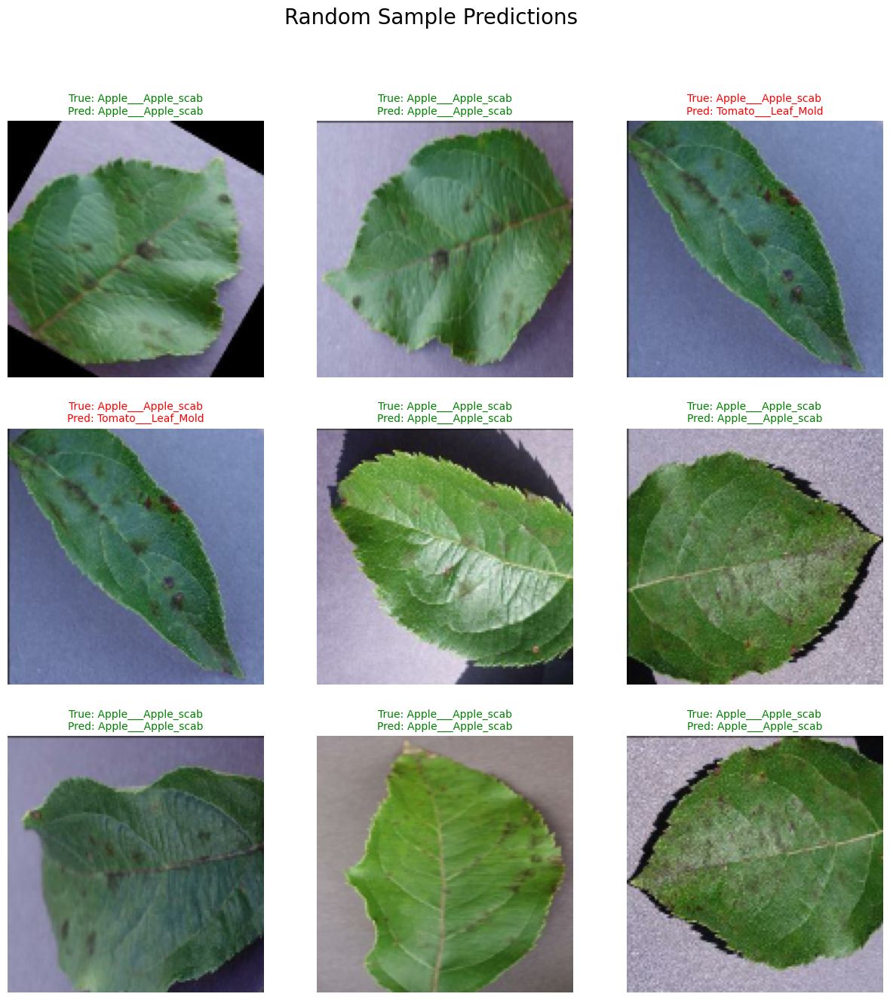

In [42]:
# Get one batch of images and labels from the test set
images, labels = next(iter(test_set))

# Predict classes for the batch
predictions = model.predict(images)
predicted_classes = np.argmax(predictions, axis=1)
true_classes = np.argmax(labels.numpy(), axis=1)

# Get class names
class_names = list(test_set.class_names)

# Plot 9 random images with their true and predicted labels
plt.figure(figsize=(15, 15))
for i in range(9):
    # Randomly choose an index
    index = np.random.randint(0, len(images))
    plt.subplot(3, 3, i+1)
    plt.imshow(images[index].numpy().astype("uint8"))
    pred_label = class_names[predicted_classes[index]]
    true_label = class_names[true_classes[index]]

    # Set the color based on whether prediction matches the true label
    color = "green" if pred_label == true_label else "red"
    plt.title(f"True: {true_label}\nPred: {pred_label}", color=color, fontsize=10)
    plt.axis('off')

# Display the plot with a title
plt.suptitle('Random Sample Predictions', fontsize=20)
plt.show()

 2. Model 2: Transfer Learning — **MobileNetV2**

In [44]:
# Again Load Training and Validation Sets
train_dir = '/content/plant_disease_dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train'
valid_dir = '/content/plant_disease_dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/valid'

In [45]:

# Load the training dataset
training_set = tf.keras.utils.image_dataset_from_directory(
    train_dir,  # Path to the training data directory
    labels='inferred',  # Labels are inferred from the directory structure
    label_mode='categorical',  # One-hot encode the labels
    batch_size=32,  # Number of images in each batch
    image_size=(128, 128),  # Resize all images to 128x128 pixels
    shuffle=True  # Shuffle the data to prevent bias
)

# Load the validation dataset
validation_set = tf.keras.utils.image_dataset_from_directory(
    valid_dir,  # Path to the validation data directory
    labels='inferred',  # Labels are inferred from the directory structure
    label_mode='categorical',  # One-hot encode the labels
    batch_size=32,  # Number of images in each batch
    image_size=(128, 128),  # Resize all images to 128x128 pixels
    shuffle=True  # Shuffle the data to prevent bias
)


Found 70295 files belonging to 38 classes.
Found 17572 files belonging to 38 classes.


In [46]:
# Enable prefetching to optimize the input pipeline
AUTOTUNE = tf.data.AUTOTUNE  # Automatically tune the buffer size for optimal performance

# Apply prefetching to the training dataset
training_set = training_set.prefetch(buffer_size=AUTOTUNE)

# Apply prefetching to the validation dataset
validation_set = validation_set.prefetch(buffer_size=AUTOTUNE)

In [48]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications import MobileNetV2

In [49]:
#2nd Model:- Build MobileNetV2 Model

# Load the MobileNetV2 model with pre-trained ImageNet weights, excluding the top layer
base_model = MobileNetV2(
    input_shape=(128, 128, 3),  # Input size of the images (128x128, RGB)
    include_top=False,  # Exclude the final fully connected layers
    weights='imagenet'  # Use pre-trained weights from ImageNet
)

# Freeze the base model (we don't want to train these layers initially)
base_model.trainable = False

# Add custom layers on top of the base model
x = base_model.output  # Get the output of the base model
x = GlobalAveragePooling2D()(x)  # Apply global average pooling
x = Dense(512, activation='relu')(x)  # Fully connected layer with 512 units and ReLU activation
x = Dropout(0.5)(x)  # Dropout layer with a 50% chance of dropout
predictions = Dense(38, activation='softmax')(x)  # Output layer with 38 classes (softmax for multi-class classification)

# Create the final model
mobilenet_model = Model(inputs=base_model.input, outputs=predictions)

# Compile the model with Adam optimizer and categorical crossentropy loss
mobilenet_model.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Display the model summary to see the architecture
mobilenet_model.summary()

Model: "functional_20"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 64, 64,    │        864 │ input_layer_2[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 64, 64,    │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 64, 64,    │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 64, 64,    │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 64, 64,    │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 64, 64,    │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 64, 64,    │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 64, 64,    │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 64, 64,    │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 64, 64,    │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 64, 64,    │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 65, 65,    │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 32, 32,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 32, 32,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 32, 32,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 32, 32,    │      2,304 │ block_1_depthwis

 Total params: 2,933,350 (11.19 MB)

 Trainable params: 675,366 (2.58 MB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [50]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Early stopping: stops training if the validation loss doesn't improve for 5 consecutive epochs
early_stop_mobilenet = EarlyStopping(
    monitor='val_loss',  # Monitor validation loss
    patience=5,  # Stop after 5 epochs with no improvement
    restore_best_weights=True,  # Restore the best weights when training stops
    verbose=1  # Print messages when training stops early
)

# Model checkpoint: save the best model based on validation loss during training
checkpoint_mobilenet = ModelCheckpoint(
    'best_mobilenet_model.h5',  # File name to save the model
    monitor='val_loss',  # Monitor validation loss
    save_best_only=True,  # Save only the best model
    verbose=1  # Print messages when saving the best model
)


In [51]:
# Train the model with only the top layers
history_initial = mobilenet_model.fit(
    training_set,  # Training dataset
    validation_data=validation_set,  # Validation dataset
    epochs=10,  # Number of epochs for training
    callbacks=[early_stop_mobilenet, checkpoint_mobilenet]  # Callbacks to monitor performance
)


Epoch 1/10
2197/2197 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.2823 - loss: 2.7113
Epoch 1: val_loss improved from inf to 1.50878, saving model to best_mobilenet_model.h5


2197/2197 ━━━━━━━━━━━━━━━━━━━━ 79s 32ms/step - accuracy: 0.2823 - loss: 2.7110 - val_accuracy: 0.5901 - val_loss: 1.5088
Epoch 2/10
2197/2197 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.5456 - loss: 1.5954
Epoch 2: val_loss improved from 1.50878 to 1.22997, saving model to best_mobilenet_model.h5


2197/2197 ━━━━━━━━━━━━━━━━━━━━ 70s 32ms/step - accuracy: 0.5456 - loss: 1.5953 - val_accuracy: 0.6522 - val_loss: 1.2300
Epoch 3/10
2196/2197 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.6100 - loss: 1.3350
Epoch 3: val_loss improved from 1.22997 to 1.09222, saving model to best_mobilenet_model.h5


2197/2197 ━━━━━━━━━━━━━━━━━━━━ 81s 31ms/step - accuracy: 0.6100 - loss: 1.3350 - val_accuracy: 0.6828 - val_loss: 1.0922
Epoch 4/10
2197/2197 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.6450 - loss: 1.1994
Epoch 4: val_loss improved from 1.09222 to 1.00273, saving model to best_mobilenet_model.h5


2197/2197 ━━━━━━━━━━━━━━━━━━━━ 72s 27ms/step - accuracy: 0.6450 - loss: 1.1994 - val_accuracy: 0.7031 - val_loss: 1.0027
Epoch 5/10
2196/2197 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.6740 - loss: 1.0971
Epoch 5: val_loss improved from 1.00273 to 0.94169, saving model to best_mobilenet_model.h5


2197/2197 ━━━━━━━━━━━━━━━━━━━━ 83s 27ms/step - accuracy: 0.6740 - loss: 1.0971 - val_accuracy: 0.7206 - val_loss: 0.9417
Epoch 6/10
2196/2197 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.6905 - loss: 1.0333
Epoch 6: val_loss improved from 0.94169 to 0.89075, saving model to best_mobilenet_model.h5


2197/2197 ━━━━━━━━━━━━━━━━━━━━ 60s 27ms/step - accuracy: 0.6905 - loss: 1.0333 - val_accuracy: 0.7336 - val_loss: 0.8907
Epoch 7/10
2197/2197 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.7042 - loss: 0.9762
Epoch 7: val_loss improved from 0.89075 to 0.86248, saving model to best_mobilenet_model.h5


2197/2197 ━━━━━━━━━━━━━━━━━━━━ 81s 27ms/step - accuracy: 0.7042 - loss: 0.9762 - val_accuracy: 0.7420 - val_loss: 0.8625
Epoch 8/10
2195/2197 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.7196 - loss: 0.9230
Epoch 8: val_loss improved from 0.86248 to 0.82858, saving model to best_mobilenet_model.h5


2197/2197 ━━━━━━━━━━━━━━━━━━━━ 81s 27ms/step - accuracy: 0.7196 - loss: 0.9230 - val_accuracy: 0.7520 - val_loss: 0.8286
Epoch 9/10
2195/2197 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.7297 - loss: 0.8940
Epoch 9: val_loss improved from 0.82858 to 0.80433, saving model to best_mobilenet_model.h5


2197/2197 ━━━━━━━━━━━━━━━━━━━━ 61s 28ms/step - accuracy: 0.7297 - loss: 0.8940 - val_accuracy: 0.7602 - val_loss: 0.8043
Epoch 10/10
2196/2197 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.7380 - loss: 0.8561
Epoch 10: val_loss improved from 0.80433 to 0.78372, saving model to best_mobilenet_model.h5


2197/2197 ━━━━━━━━━━━━━━━━━━━━ 82s 28ms/step - accuracy: 0.7380 - loss: 0.8561 - val_accuracy: 0.7613 - val_loss: 0.7837
Restoring model weights from the end of the best epoch: 10.


In [52]:
# Fine-tune the MobileNetV2 model by unfreezing some layers
base_model.trainable = True  # Allow training of the base model

# Freeze the first 100 layers of the base model to keep their weights fixed
fine_tune_at = 100
for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

# Recompile the model with a smaller learning rate for fine-tuning
mobilenet_model.compile(
    optimizer=Adam(learning_rate=1e-5),  # Lower learning rate for fine-tuning
    loss='categorical_crossentropy',  # Loss function for multi-class classification
    metrics=['accuracy']  # Track accuracy during training
)



In [53]:
# Fine-tune the full MobileNetV2 model
history_finetune = mobilenet_model.fit(
    training_set,  # Training dataset
    validation_data=validation_set,  # Validation dataset
    epochs=20,  # Number of epochs for fine-tuning
    callbacks=[early_stop_mobilenet, checkpoint_mobilenet]  # Callbacks for early stopping and saving the best model
)


Epoch 1/20
2197/2197 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - accuracy: 0.2953 - loss: 4.7712
Epoch 1: val_loss did not improve from 0.78372
2197/2197 ━━━━━━━━━━━━━━━━━━━━ 103s 38ms/step - accuracy: 0.2953 - loss: 4.7703 - val_accuracy: 0.6403 - val_loss: 1.2376
Epoch 2/20
2196/2197 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.6092 - loss: 1.3142
Epoch 2: val_loss did not improve from 0.78372
2197/2197 ━━━━━━━━━━━━━━━━━━━━ 73s 33ms/step - accuracy: 0.6093 - loss: 1.3141 - val_accuracy: 0.7338 - val_loss: 0.8721
Epoch 3/20
2195/2197 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.7036 - loss: 0.9622
Epoch 3: val_loss improved from 0.78372 to 0.70238, saving model to best_mobilenet_model.h5


2197/2197 ━━━━━━━━━━━━━━━━━━━━ 64s 29ms/step - accuracy: 0.7036 - loss: 0.9622 - val_accuracy: 0.7818 - val_loss: 0.7024
Epoch 4/20
2195/2197 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.7602 - loss: 0.7634
Epoch 4: val_loss improved from 0.70238 to 0.60221, saving model to best_mobilenet_model.h5


2197/2197 ━━━━━━━━━━━━━━━━━━━━ 64s 29ms/step - accuracy: 0.7602 - loss: 0.7633 - val_accuracy: 0.8126 - val_loss: 0.6022
Epoch 5/20
2196/2197 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.7976 - loss: 0.6426
Epoch 5: val_loss improved from 0.60221 to 0.53169, saving model to best_mobilenet_model.h5


2197/2197 ━━━━━━━━━━━━━━━━━━━━ 74s 34ms/step - accuracy: 0.7977 - loss: 0.6426 - val_accuracy: 0.8325 - val_loss: 0.5317
Epoch 6/20
2196/2197 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.8234 - loss: 0.5554
Epoch 6: val_loss improved from 0.53169 to 0.48372, saving model to best_mobilenet_model.h5


2197/2197 ━━━━━━━━━━━━━━━━━━━━ 74s 33ms/step - accuracy: 0.8234 - loss: 0.5554 - val_accuracy: 0.8442 - val_loss: 0.4837
Epoch 7/20
2196/2197 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.8474 - loss: 0.4789
Epoch 7: val_loss improved from 0.48372 to 0.45531, saving model to best_mobilenet_model.h5


2197/2197 ━━━━━━━━━━━━━━━━━━━━ 65s 30ms/step - accuracy: 0.8474 - loss: 0.4789 - val_accuracy: 0.8549 - val_loss: 0.4553
Epoch 8/20
2197/2197 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.8646 - loss: 0.4176
Epoch 8: val_loss improved from 0.45531 to 0.42361, saving model to best_mobilenet_model.h5


2197/2197 ━━━━━━━━━━━━━━━━━━━━ 90s 33ms/step - accuracy: 0.8646 - loss: 0.4176 - val_accuracy: 0.8655 - val_loss: 0.4236
Epoch 9/20
2196/2197 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.8806 - loss: 0.3685
Epoch 9: val_loss improved from 0.42361 to 0.40799, saving model to best_mobilenet_model.h5


2197/2197 ━━━━━━━━━━━━━━━━━━━━ 73s 33ms/step - accuracy: 0.8806 - loss: 0.3685 - val_accuracy: 0.8712 - val_loss: 0.4080
Epoch 10/20
2196/2197 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.8930 - loss: 0.3279
Epoch 10: val_loss improved from 0.40799 to 0.39054, saving model to best_mobilenet_model.h5


2197/2197 ━━━━━━━━━━━━━━━━━━━━ 73s 29ms/step - accuracy: 0.8930 - loss: 0.3279 - val_accuracy: 0.8755 - val_loss: 0.3905
Epoch 11/20
2195/2197 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.9037 - loss: 0.2931
Epoch 11: val_loss improved from 0.39054 to 0.37998, saving model to best_mobilenet_model.h5


2197/2197 ━━━━━━━━━━━━━━━━━━━━ 92s 34ms/step - accuracy: 0.9037 - loss: 0.2931 - val_accuracy: 0.8776 - val_loss: 0.3800
Epoch 12/20
2196/2197 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.9128 - loss: 0.2596
Epoch 12: val_loss improved from 0.37998 to 0.36571, saving model to best_mobilenet_model.h5


2197/2197 ━━━━━━━━━━━━━━━━━━━━ 74s 34ms/step - accuracy: 0.9128 - loss: 0.2596 - val_accuracy: 0.8828 - val_loss: 0.3657
Epoch 13/20
2195/2197 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.9199 - loss: 0.2395
Epoch 13: val_loss did not improve from 0.36571
2197/2197 ━━━━━━━━━━━━━━━━━━━━ 64s 29ms/step - accuracy: 0.9199 - loss: 0.2395 - val_accuracy: 0.8859 - val_loss: 0.3725
Epoch 14/20
2197/2197 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.9296 - loss: 0.2132
Epoch 14: val_loss improved from 0.36571 to 0.35852, saving model to best_mobilenet_model.h5


2197/2197 ━━━━━━━━━━━━━━━━━━━━ 92s 33ms/step - accuracy: 0.9296 - loss: 0.2132 - val_accuracy: 0.8873 - val_loss: 0.3585
Epoch 15/20
2196/2197 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.9355 - loss: 0.1925
Epoch 15: val_loss improved from 0.35852 to 0.35455, saving model to best_mobilenet_model.h5


2197/2197 ━━━━━━━━━━━━━━━━━━━━ 73s 29ms/step - accuracy: 0.9356 - loss: 0.1925 - val_accuracy: 0.8898 - val_loss: 0.3545
Epoch 16/20
2196/2197 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.9422 - loss: 0.1717
Epoch 16: val_loss improved from 0.35455 to 0.35256, saving model to best_mobilenet_model.h5


2197/2197 ━━━━━━━━━━━━━━━━━━━━ 91s 33ms/step - accuracy: 0.9422 - loss: 0.1717 - val_accuracy: 0.8927 - val_loss: 0.3526
Epoch 17/20
2197/2197 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.9485 - loss: 0.1520
Epoch 17: val_loss improved from 0.35256 to 0.34374, saving model to best_mobilenet_model.h5


2197/2197 ━━━━━━━━━━━━━━━━━━━━ 82s 34ms/step - accuracy: 0.9485 - loss: 0.1520 - val_accuracy: 0.8985 - val_loss: 0.3437
Epoch 18/20
2197/2197 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.9518 - loss: 0.1398
Epoch 18: val_loss improved from 0.34374 to 0.33875, saving model to best_mobilenet_model.h5


2197/2197 ━━━━━━━━━━━━━━━━━━━━ 72s 29ms/step - accuracy: 0.9518 - loss: 0.1398 - val_accuracy: 0.8978 - val_loss: 0.3388
Epoch 19/20
2197/2197 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.9581 - loss: 0.1244
Epoch 19: val_loss improved from 0.33875 to 0.33844, saving model to best_mobilenet_model.h5


2197/2197 ━━━━━━━━━━━━━━━━━━━━ 83s 29ms/step - accuracy: 0.9581 - loss: 0.1244 - val_accuracy: 0.8980 - val_loss: 0.3384
Epoch 20/20
2195/2197 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.9609 - loss: 0.1158
Epoch 20: val_loss improved from 0.33844 to 0.33185, saving model to best_mobilenet_model.h5


2197/2197 ━━━━━━━━━━━━━━━━━━━━ 73s 33ms/step - accuracy: 0.9609 - loss: 0.1158 - val_accuracy: 0.9028 - val_loss: 0.3319
Restoring model weights from the end of the best epoch: 20.


In [54]:
# evaluate the model on the training and validation datasets
train_loss, train_acc = mobilenet_model.evaluate(training_set)  # Evaluate on training set
val_loss, val_acc = mobilenet_model.evaluate(validation_set)  # Evaluate on validation set

# printing evaluation results
print(f"\nTrain Accuracy: {train_acc:.4f}, Train Loss: {train_loss:.4f}")
print(f"Validation Accuracy: {val_acc:.4f}, Validation Loss: {val_loss:.4f}")


2197/2197 ━━━━━━━━━━━━━━━━━━━━ 50s 23ms/step - accuracy: 0.9972 - loss: 0.0168
550/550 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - accuracy: 0.9047 - loss: 0.3255

Train Accuracy: 0.9975, Train Loss: 0.0155
Validation Accuracy: 0.9028, Validation Loss: 0.3319


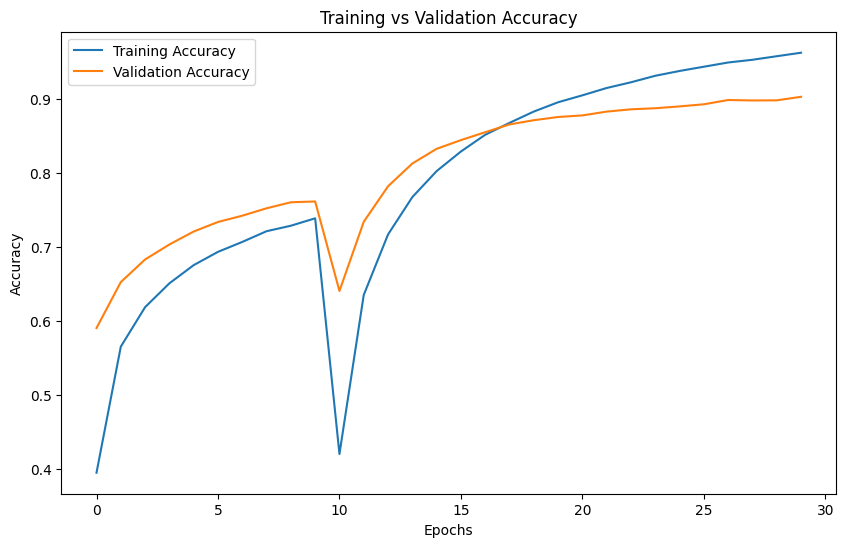

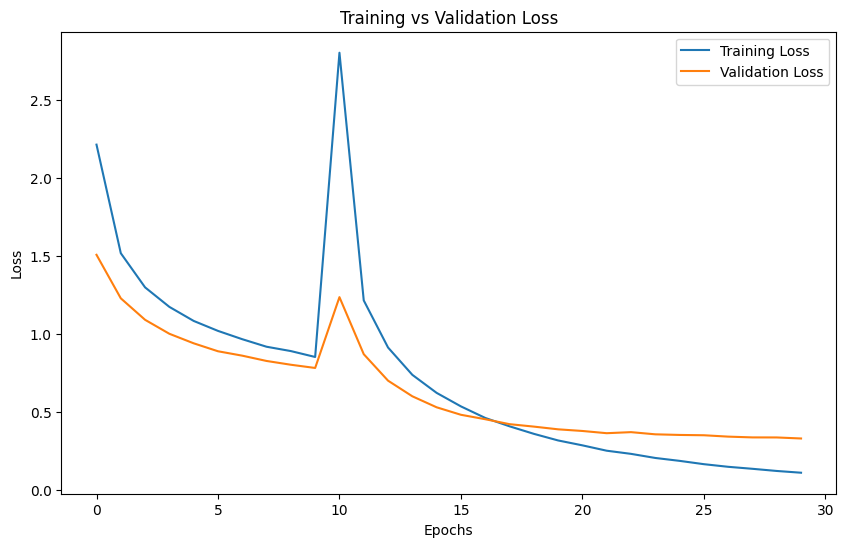

In [55]:
# Plot training and validation accuracy
plt.figure(figsize=(10,6))
plt.plot(history_initial.history['accuracy'] + history_finetune.history['accuracy'], label='Training Accuracy')
plt.plot(history_initial.history['val_accuracy'] + history_finetune.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training vs Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot training and validation loss
plt.figure(figsize=(10,6))
plt.plot(history_initial.history['loss'] + history_finetune.history['loss'], label='Training Loss')
plt.plot(history_initial.history['val_loss'] + history_finetune.history['val_loss'], label='Validation Loss')
plt.title('Training vs Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

Found 17572 files belonging to 38 classes.
550/550 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step


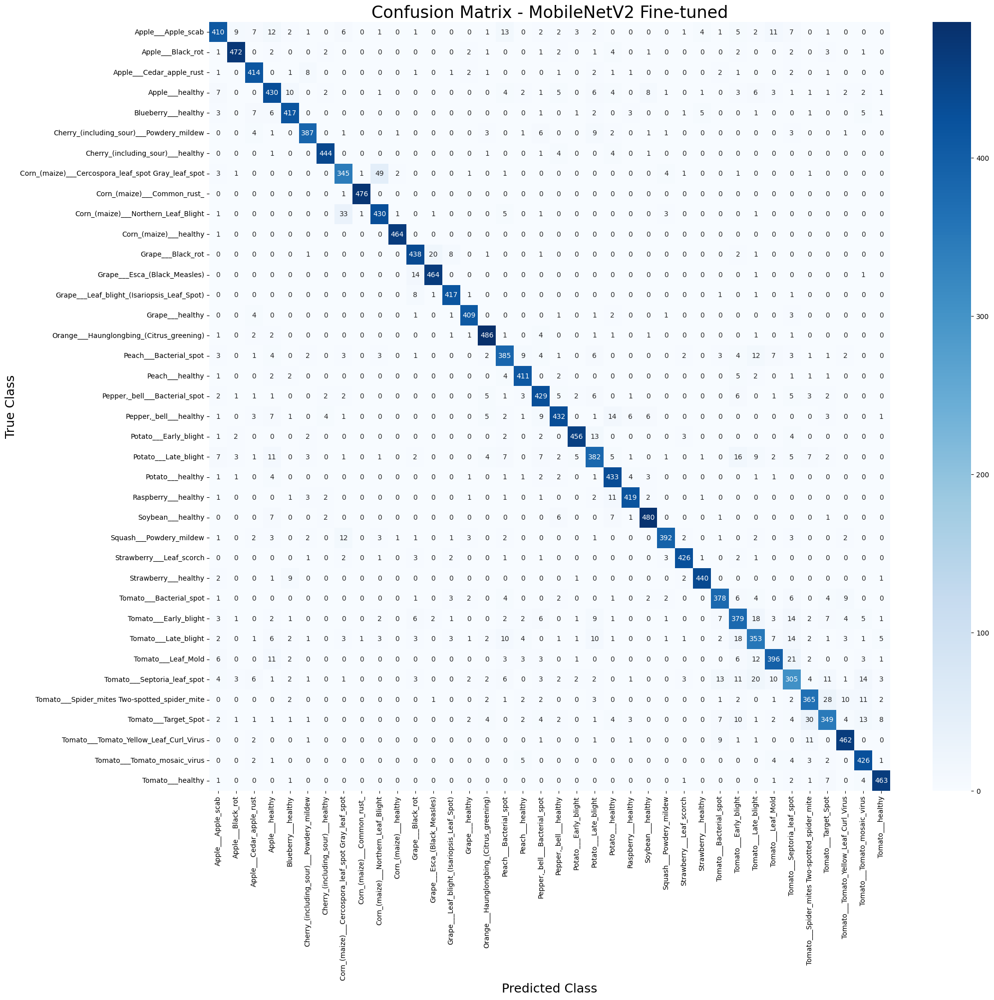

In [56]:
# Confusion Matrix for mobilenet model

# Reload validation set (shuffling is disabled to keep the true order of the data)
test_set = tf.keras.utils.image_dataset_from_directory(
    valid_dir,
    labels='inferred',
    label_mode='categorical',
    batch_size=32,
    image_size=(128, 128),
    shuffle=False
)

# Get the class names
class_names = test_set.class_names

# Get model predictions
y_pred = mobilenet_model.predict(test_set)
y_pred_classes = np.argmax(y_pred, axis=1)

# Get the true labels
y_true = np.concatenate([y for x, y in test_set], axis=0)
y_true_classes = np.argmax(y_true, axis=1)

# Compute the confusion matrix
cm = confusion_matrix(y_true_classes, y_pred_classes)

# Plot the confusion matrix
plt.figure(figsize=(22, 20))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix - MobileNetV2 Fine-tuned', fontsize=24)
plt.xlabel('Predicted Class', fontsize=18)
plt.ylabel('True Class', fontsize=18)
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.show()

In [57]:
# Print the classification report for the model
print("\nClassification Report:\n")
print(classification_report(y_true_classes, y_pred_classes, target_names=class_names))


Classification Report:

                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       0.88      0.81      0.84       504
                                 Apple___Black_rot       0.96      0.95      0.95       497
                          Apple___Cedar_apple_rust       0.90      0.94      0.92       440
                                   Apple___healthy       0.83      0.86      0.84       502
                               Blueberry___healthy       0.92      0.92      0.92       454
          Cherry_(including_sour)___Powdery_mildew       0.93      0.92      0.93       421
                 Cherry_(including_sour)___healthy       0.97      0.97      0.97       456
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.84      0.84      0.84       410
                       Corn_(maize)___Common_rust_       0.99      1.00      1.00       477
               Corn_(maize)___Northern_Leaf_Blight    

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


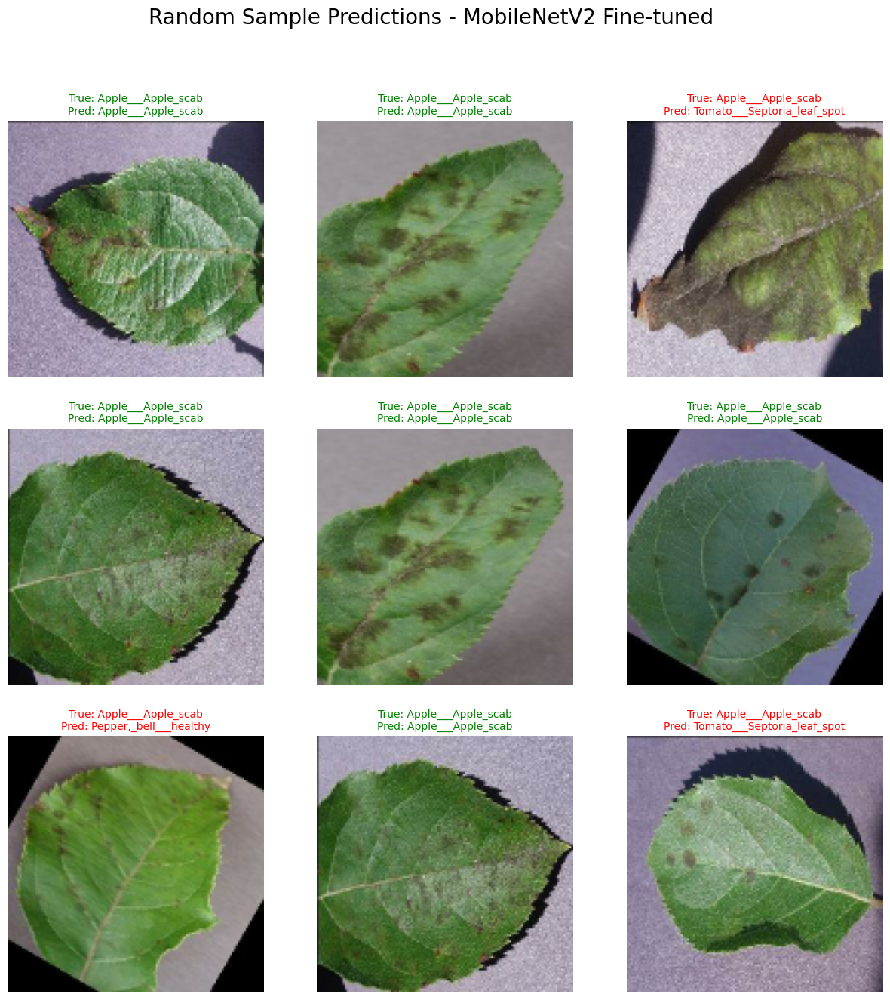

In [59]:

# Get one batch of images and labels from the validation/test set
images, labels = next(iter(test_set))

# Make predictions on the batch
predictions = mobilenet_model.predict(images)
predicted_classes = np.argmax(predictions, axis=1)
true_classes = np.argmax(labels.numpy(), axis=1)

# Get class names
class_names = list(test_set.class_names)

# Plot random 9 images and their predicted vs true labels
plt.figure(figsize=(15, 15))
for i in range(9):
    index = np.random.randint(0, len(images))  # Pick a random image index
    plt.subplot(3, 3, i+1)
    plt.imshow(images[index].numpy().astype("uint8"))

    # Get predicted and true labels
    pred_label = class_names[predicted_classes[index]]
    true_label = class_names[true_classes[index]]

    # Color the title green if prediction is correct, red if incorrect
    color = "green" if pred_label == true_label else "red"

    plt.title(f"True: {true_label}\nPred: {pred_label}", color=color, fontsize=10)
    plt.axis('off')  # Hide axis for better visual

plt.suptitle('Random Sample Predictions - MobileNetV2 Fine-tuned', fontsize=20)
plt.show()

--------------------
**3rd Model VGG16**

In [61]:
### again importing libraries

from tensorflow.keras.applications import VGG16
from tensorflow.keras.layers import Dense, Dropout, Flatten, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix


In [63]:
# Load the VGG16 base model without the top layer
base_vgg16 = VGG16(
    input_shape=(128, 128, 3),
    include_top=False,
    weights='imagenet'
)

# Freeze the base model layers
base_vgg16.trainable = False

# Add custom layers on top of VGG16
x = base_vgg16.output
x = GlobalAveragePooling2D()(x)
x = Dense(512, activation='relu')(x)
x = Dropout(0.5)(x)
outputs = Dense(38, activation='softmax')(x)

# Create the final model
vgg16_model = Model(inputs=base_vgg16.input, outputs=outputs)

# Compile the model
vgg16_model.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Show the model summary
vgg16_model.summary()

Model: "functional_22"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_4 (InputLayer)      │ (None, 128, 128, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 128, 128, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 128, 128, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 64, 64, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 64, 64, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 32, 32, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 32, 32, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 32, 32, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 16, 16, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 16, 16, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 16, 16, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 8, 8, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 8, 8, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 8, 8, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 8, 8, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 4, 4, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_3      │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 512)            │       262,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 38)             │        19,494 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,996,838 (57.21 MB)

 Trainable params: 282,150 (1.08 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

In [64]:
# Early stopping and checkpoint callbacks
early_stop_vgg16 = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, verbose=1)
checkpoint_vgg16 = tf.keras.callbacks.ModelCheckpoint('best_vgg16_model.h5', monitor='val_loss', save_best_only=True, verbose=1)

# Train the model
history_vgg16 = vgg16_model.fit(
    training_set,  # Training dataset
    epochs=20,  # Number of epochs
    validation_data=validation_set,  # Validation dataset
    callbacks=[early_stop_vgg16, checkpoint_vgg16]  # Callbacks for early stopping and saving the best model
)


Epoch 1/20
2197/2197 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - accuracy: 0.3302 - loss: 4.9314
Epoch 1: val_loss improved from inf to 0.59809, saving model to best_vgg16_model.h5


2197/2197 ━━━━━━━━━━━━━━━━━━━━ 183s 80ms/step - accuracy: 0.3303 - loss: 4.9303 - val_accuracy: 0.8231 - val_loss: 0.5981
Epoch 2/20
2196/2197 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - accuracy: 0.7404 - loss: 0.8706
Epoch 2: val_loss improved from 0.59809 to 0.38495, saving model to best_vgg16_model.h5


2197/2197 ━━━━━━━━━━━━━━━━━━━━ 186s 75ms/step - accuracy: 0.7404 - loss: 0.8705 - val_accuracy: 0.8805 - val_loss: 0.3850
Epoch 3/20
2196/2197 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - accuracy: 0.8211 - loss: 0.5740
Epoch 3: val_loss improved from 0.38495 to 0.30213, saving model to best_vgg16_model.h5


2197/2197 ━━━━━━━━━━━━━━━━━━━━ 202s 75ms/step - accuracy: 0.8211 - loss: 0.5740 - val_accuracy: 0.9031 - val_loss: 0.3021
Epoch 4/20
2196/2197 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - accuracy: 0.8613 - loss: 0.4368
Epoch 4: val_loss improved from 0.30213 to 0.25805, saving model to best_vgg16_model.h5


2197/2197 ━━━━━━━━━━━━━━━━━━━━ 202s 75ms/step - accuracy: 0.8613 - loss: 0.4368 - val_accuracy: 0.9164 - val_loss: 0.2581
Epoch 5/20
2196/2197 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - accuracy: 0.8823 - loss: 0.3635
Epoch 5: val_loss improved from 0.25805 to 0.22423, saving model to best_vgg16_model.h5


2197/2197 ━━━━━━━━━━━━━━━━━━━━ 202s 75ms/step - accuracy: 0.8823 - loss: 0.3635 - val_accuracy: 0.9265 - val_loss: 0.2242
Epoch 6/20
2196/2197 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - accuracy: 0.9008 - loss: 0.3004
Epoch 6: val_loss improved from 0.22423 to 0.20712, saving model to best_vgg16_model.h5


2197/2197 ━━━━━━━━━━━━━━━━━━━━ 166s 75ms/step - accuracy: 0.9008 - loss: 0.3004 - val_accuracy: 0.9318 - val_loss: 0.2071
Epoch 7/20
2196/2197 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - accuracy: 0.9104 - loss: 0.2687
Epoch 7: val_loss improved from 0.20712 to 0.19037, saving model to best_vgg16_model.h5


2197/2197 ━━━━━━━━━━━━━━━━━━━━ 174s 79ms/step - accuracy: 0.9104 - loss: 0.2687 - val_accuracy: 0.9383 - val_loss: 0.1904
Epoch 8/20
2196/2197 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - accuracy: 0.9196 - loss: 0.2364
Epoch 8: val_loss improved from 0.19037 to 0.18106, saving model to best_vgg16_model.h5


2197/2197 ━━━━━━━━━━━━━━━━━━━━ 166s 75ms/step - accuracy: 0.9196 - loss: 0.2364 - val_accuracy: 0.9408 - val_loss: 0.1811
Epoch 9/20
2196/2197 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - accuracy: 0.9285 - loss: 0.2095
Epoch 9: val_loss improved from 0.18106 to 0.17134, saving model to best_vgg16_model.h5


2197/2197 ━━━━━━━━━━━━━━━━━━━━ 210s 79ms/step - accuracy: 0.9285 - loss: 0.2095 - val_accuracy: 0.9438 - val_loss: 0.1713
Epoch 10/20
2196/2197 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - accuracy: 0.9350 - loss: 0.1934
Epoch 10: val_loss improved from 0.17134 to 0.16381, saving model to best_vgg16_model.h5


2197/2197 ━━━━━━━━━━━━━━━━━━━━ 202s 79ms/step - accuracy: 0.9350 - loss: 0.1934 - val_accuracy: 0.9462 - val_loss: 0.1638
Epoch 11/20
2196/2197 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - accuracy: 0.9380 - loss: 0.1778
Epoch 11: val_loss improved from 0.16381 to 0.15736, saving model to best_vgg16_model.h5


2197/2197 ━━━━━━━━━━━━━━━━━━━━ 193s 75ms/step - accuracy: 0.9380 - loss: 0.1778 - val_accuracy: 0.9467 - val_loss: 0.1574
Epoch 12/20
2196/2197 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - accuracy: 0.9440 - loss: 0.1633
Epoch 12: val_loss improved from 0.15736 to 0.15028, saving model to best_vgg16_model.h5


2197/2197 ━━━━━━━━━━━━━━━━━━━━ 166s 75ms/step - accuracy: 0.9440 - loss: 0.1633 - val_accuracy: 0.9506 - val_loss: 0.1503
Epoch 13/20
2196/2197 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - accuracy: 0.9478 - loss: 0.1524
Epoch 13: val_loss improved from 0.15028 to 0.14652, saving model to best_vgg16_model.h5


2197/2197 ━━━━━━━━━━━━━━━━━━━━ 202s 76ms/step - accuracy: 0.9478 - loss: 0.1524 - val_accuracy: 0.9512 - val_loss: 0.1465
Epoch 14/20
2196/2197 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - accuracy: 0.9530 - loss: 0.1395
Epoch 14: val_loss improved from 0.14652 to 0.14599, saving model to best_vgg16_model.h5


2197/2197 ━━━━━━━━━━━━━━━━━━━━ 174s 79ms/step - accuracy: 0.9530 - loss: 0.1395 - val_accuracy: 0.9513 - val_loss: 0.1460
Epoch 15/20
2196/2197 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - accuracy: 0.9538 - loss: 0.1340
Epoch 15: val_loss improved from 0.14599 to 0.14097, saving model to best_vgg16_model.h5


2197/2197 ━━━━━━━━━━━━━━━━━━━━ 202s 79ms/step - accuracy: 0.9538 - loss: 0.1340 - val_accuracy: 0.9534 - val_loss: 0.1410
Epoch 16/20
2196/2197 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - accuracy: 0.9557 - loss: 0.1265
Epoch 16: val_loss improved from 0.14097 to 0.13546, saving model to best_vgg16_model.h5


2197/2197 ━━━━━━━━━━━━━━━━━━━━ 165s 75ms/step - accuracy: 0.9557 - loss: 0.1265 - val_accuracy: 0.9561 - val_loss: 0.1355
Epoch 17/20
2196/2197 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - accuracy: 0.9592 - loss: 0.1182
Epoch 17: val_loss did not improve from 0.13546
2197/2197 ━━━━━━━━━━━━━━━━━━━━ 174s 79ms/step - accuracy: 0.9592 - loss: 0.1182 - val_accuracy: 0.9561 - val_loss: 0.1358
Epoch 18/20
2196/2197 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - accuracy: 0.9601 - loss: 0.1156
Epoch 18: val_loss improved from 0.13546 to 0.13408, saving model to best_vgg16_model.h5


2197/2197 ━━━━━━━━━━━━━━━━━━━━ 194s 76ms/step - accuracy: 0.9601 - loss: 0.1156 - val_accuracy: 0.9557 - val_loss: 0.1341
Epoch 19/20
2196/2197 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - accuracy: 0.9626 - loss: 0.1064
Epoch 19: val_loss improved from 0.13408 to 0.13198, saving model to best_vgg16_model.h5


2197/2197 ━━━━━━━━━━━━━━━━━━━━ 175s 80ms/step - accuracy: 0.9626 - loss: 0.1064 - val_accuracy: 0.9566 - val_loss: 0.1320
Epoch 20/20
2196/2197 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - accuracy: 0.9642 - loss: 0.1021
Epoch 20: val_loss improved from 0.13198 to 0.12829, saving model to best_vgg16_model.h5


2197/2197 ━━━━━━━━━━━━━━━━━━━━ 193s 76ms/step - accuracy: 0.9642 - loss: 0.1021 - val_accuracy: 0.9577 - val_loss: 0.1283
Restoring model weights from the end of the best epoch: 20.


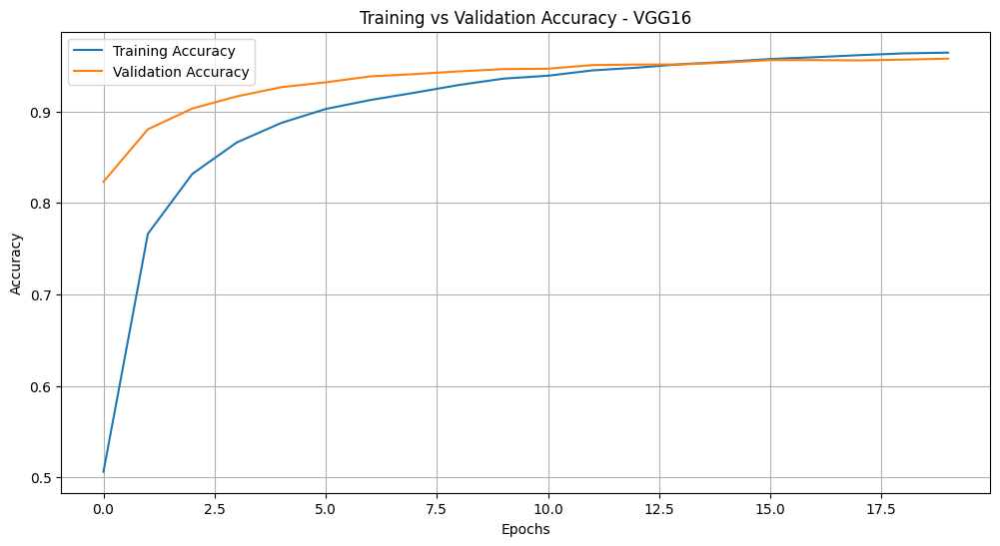

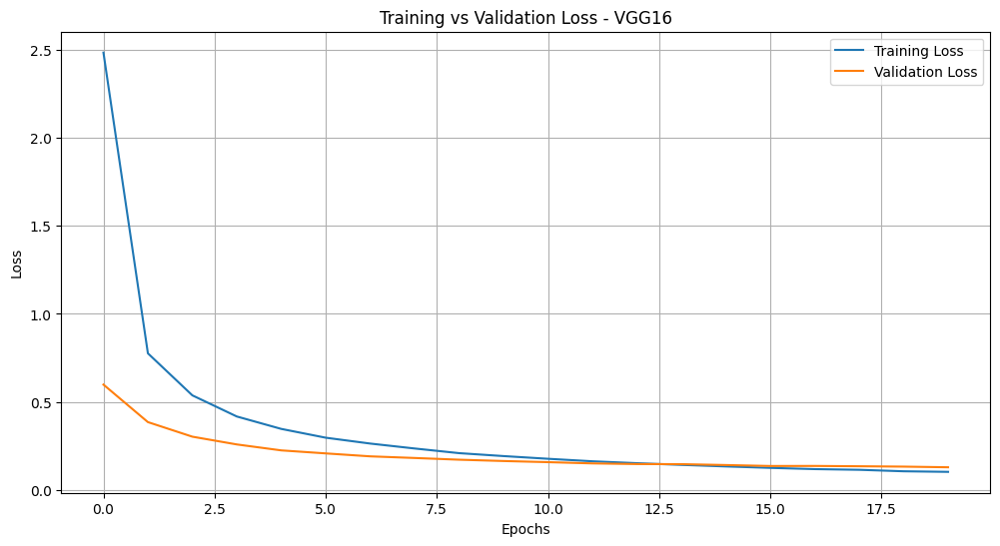

In [65]:
# Accuracy plot
plt.figure(figsize=(12,6))
plt.plot(history_vgg16.history['accuracy'], label='Training Accuracy')
plt.plot(history_vgg16.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training vs Validation Accuracy - VGG16')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()

# Loss plot
plt.figure(figsize=(12,6))
plt.plot(history_vgg16.history['loss'], label='Training Loss')
plt.plot(history_vgg16.history['val_loss'], label='Validation Loss')
plt.title('Training vs Validation Loss - VGG16')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()


In [66]:
# Evaluate the model on the training and validation sets
train_loss_vgg16, train_acc_vgg16 = vgg16_model.evaluate(training_set)
val_loss_vgg16, val_acc_vgg16 = vgg16_model.evaluate(validation_set)

# Print the evaluation results
print(f"Training Accuracy: {train_acc_vgg16:.4f}")
print(f"Validation Accuracy: {val_acc_vgg16:.4f}")


2197/2197 ━━━━━━━━━━━━━━━━━━━━ 134s 61ms/step - accuracy: 0.9927 - loss: 0.0324
550/550 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step - accuracy: 0.9581 - loss: 0.1335
Training Accuracy: 0.9929
Validation Accuracy: 0.9577


550/550 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step


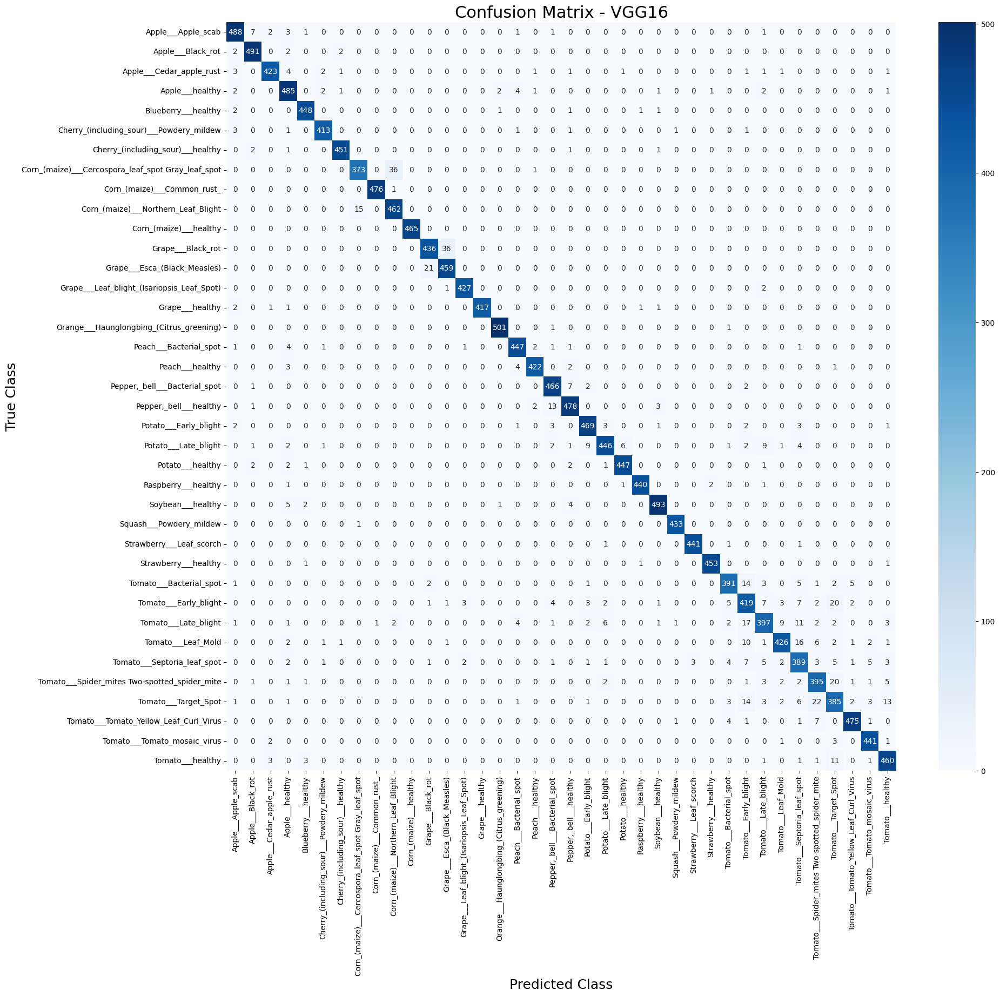

In [67]:
# Make predictions on the test set using the trained model
y_pred = vgg16_model.predict(test_set)  # Using VGG16 model for predictions
y_pred_classes = np.argmax(y_pred, axis=1)  # Get predicted class labels

# get the true labels from the test set
y_true = np.concatenate([y for x, y in test_set], axis=0)
y_true_classes = np.argmax(y_true, axis=1)  # Get true class labels

# get the class names (labels) from the test set
class_names = list(test_set.class_names)

#calculate the confusion matrix
cm_vgg16 = confusion_matrix(y_true_classes, y_pred_classes)

#plot the confusion matrix
plt.figure(figsize=(20, 18))
sns.heatmap(cm_vgg16, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix - VGG16', fontsize=22)
plt.xlabel('Predicted Class', fontsize=18)
plt.ylabel('True Class', fontsize=18)
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.show()


In [68]:
#print the classification report
print("\nClassification Report:\n")
print(classification_report(y_true_classes, y_pred_classes, target_names=class_names))



Classification Report:

                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       0.96      0.97      0.96       504
                                 Apple___Black_rot       0.97      0.99      0.98       497
                          Apple___Cedar_apple_rust       0.98      0.96      0.97       440
                                   Apple___healthy       0.93      0.97      0.95       502
                               Blueberry___healthy       0.98      0.99      0.98       454
          Cherry_(including_sour)___Powdery_mildew       0.98      0.98      0.98       421
                 Cherry_(including_sour)___healthy       0.99      0.99      0.99       456
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.96      0.91      0.93       410
                       Corn_(maize)___Common_rust_       1.00      1.00      1.00       477
               Corn_(maize)___Northern_Leaf_Blight    

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 766ms/step


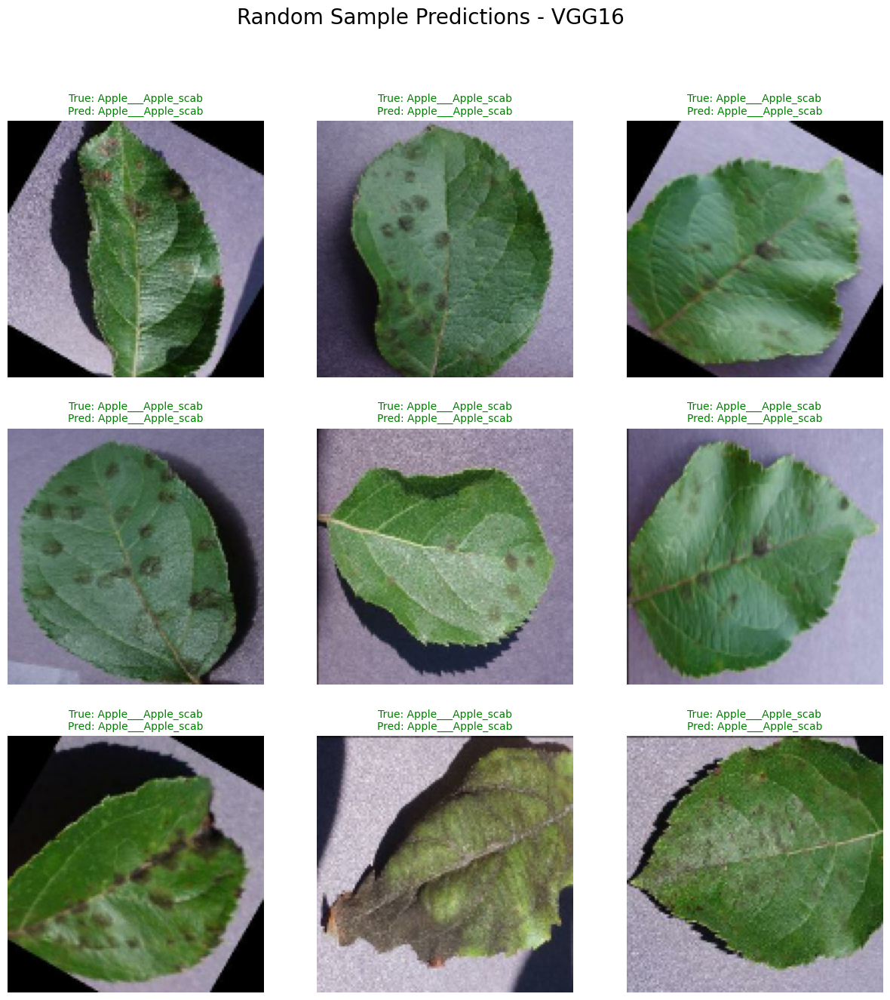

In [69]:
#get one batch of images and labels from the test/validation set
images, labels = next(iter(test_set))

#make predictions on the batch using the VGG16 model
predictions = vgg16_model.predict(images)
predicted_classes = np.argmax(predictions, axis=1)
true_classes = np.argmax(labels.numpy(), axis=1)

#get class names from the test set
class_names = list(test_set.class_names)

#plot random 9 images with their true and predicted labels
plt.figure(figsize=(15, 15))
for i in range(9):
    index = np.random.randint(0, len(images))  # Pick a random image index
    plt.subplot(3, 3, i+1)
    plt.imshow(images[index].numpy().astype("uint8"))  # Display the image
    pred_label = class_names[predicted_classes[index]]  # Predicted label
    true_label = class_names[true_classes[index]]  # True label


    color = "green" if pred_label == true_label else "red"  # Color the title green if prediction is correct, red if incorrect

    plt.title(f"True: {true_label}\nPred: {pred_label}", color=color, fontsize=10)
    plt.axis('off')  # Turn off axis for cleaner display

# Add a title to the plot
plt.suptitle('Random Sample Predictions - VGG16', fontsize=20)
plt.show()


In [70]:
#evaluate Base CNN --1st model
base_train_loss, base_train_acc = model.evaluate(training_set)
base_val_loss, base_val_acc = model.evaluate(validation_set)

print("\nBase CNN Results:")
print(f"Training Accuracy: {base_train_acc:.4f}, Training Loss: {base_train_loss:.4f}")
print(f"Validation Accuracy: {base_val_acc:.4f}, Validation Loss: {base_val_loss:.4f}")

#evaluate MobileNetV2 Fine-tuned Model --- 2nd model
mobilenet_train_loss, mobilenet_train_acc = mobilenet_model.evaluate(training_set)
mobilenet_val_loss, mobilenet_val_acc = mobilenet_model.evaluate(validation_set)

print("\nMobileNetV2 Fine-tuned Results:")
print(f"Training Accuracy: {mobilenet_train_acc:.4f}, Training Loss: {mobilenet_train_loss:.4f}")
print(f"Validation Accuracy: {mobilenet_val_acc:.4f}, Validation Loss: {mobilenet_val_loss:.4f}")

# evaluate VGG16 Model --- 3rd model
vgg16_train_loss, vgg16_train_acc = vgg16_model.evaluate(training_set)
vgg16_val_loss, vgg16_val_acc = vgg16_model.evaluate(validation_set)

print("\nVGG16 Results:")
print(f"Training Accuracy: {vgg16_train_acc:.4f}, Training Loss: {vgg16_train_loss:.4f}")
print(f"Validation Accuracy: {vgg16_val_acc:.4f}, Validation Loss: {vgg16_val_loss:.4f}")



2197/2197 ━━━━━━━━━━━━━━━━━━━━ 44s 20ms/step - accuracy: 0.9920 - loss: 0.0256
550/550 ━━━━━━━━━━━━━━━━━━━━ 11s 20ms/step - accuracy: 0.9659 - loss: 0.1241

Base CNN Results:
Training Accuracy: 0.9915, Training Loss: 0.0265
Validation Accuracy: 0.9674, Validation Loss: 0.1144
2197/2197 ━━━━━━━━━━━━━━━━━━━━ 49s 22ms/step - accuracy: 0.9973 - loss: 0.0167
550/550 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - accuracy: 0.9045 - loss: 0.3276

MobileNetV2 Fine-tuned Results:
Training Accuracy: 0.9975, Training Loss: 0.0155
Validation Accuracy: 0.9028, Validation Loss: 0.3319
2197/2197 ━━━━━━━━━━━━━━━━━━━━ 135s 61ms/step - accuracy: 0.9927 - loss: 0.0325
550/550 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step - accuracy: 0.9582 - loss: 0.1335

VGG16 Results:
Training Accuracy: 0.9929, Training Loss: 0.0315
Validation Accuracy: 0.9577, Validation Loss: 0.1283


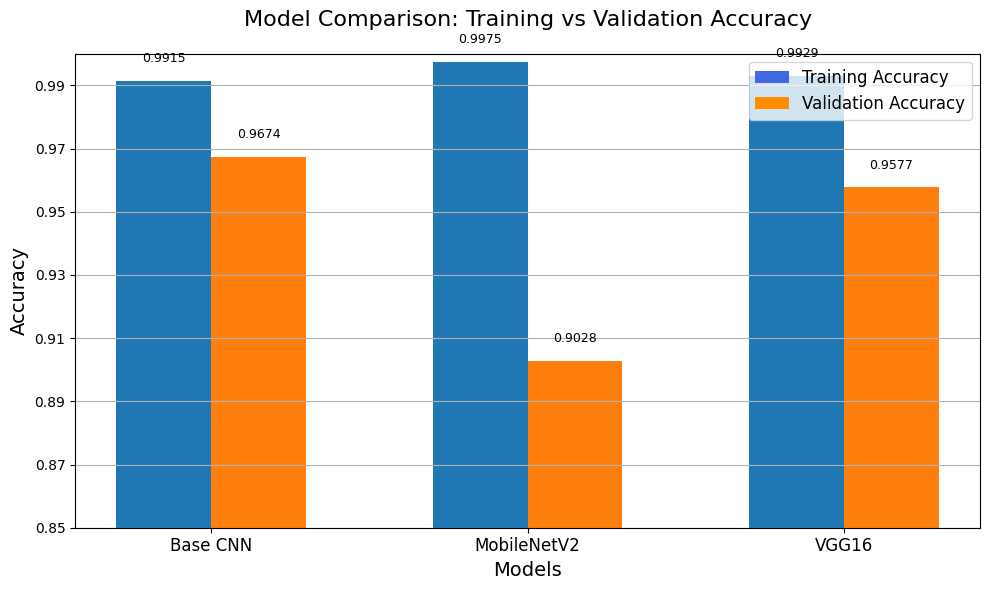

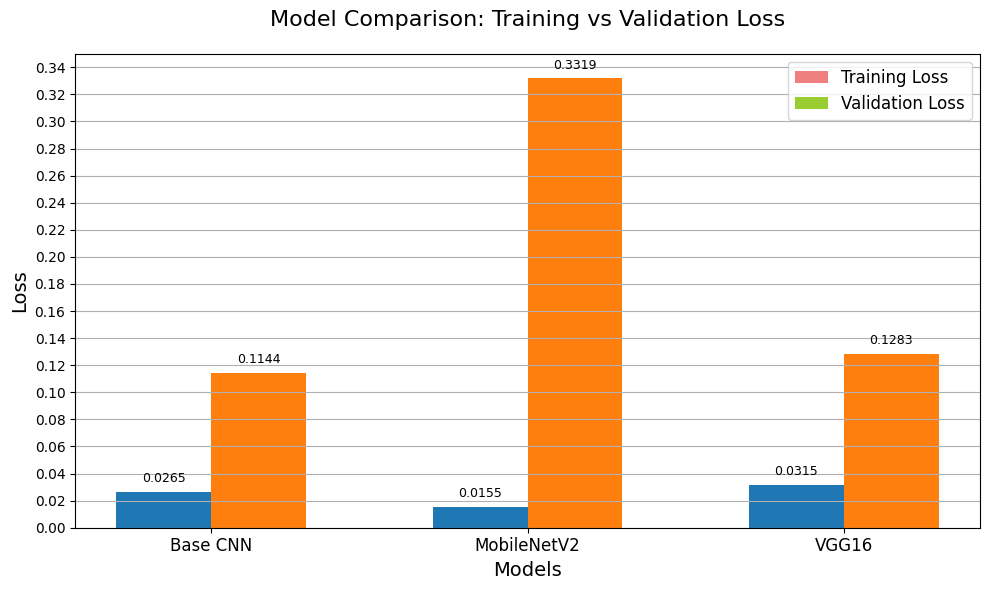

In [72]:
# Model names
models = ['Base CNN', 'MobileNetV2', 'VGG16']

# Training and validation accuracies
train_accuracy = [0.9915, 0.9975, 0.9929]
val_accuracy = [0.9674, 0.9028, 0.9577]

# Training and validation losses
train_loss = [0.0265, 0.0155, 0.0315]
val_loss = [0.1144, 0.3319, 0.1283]

# Set figure size
plt.figure(figsize=(10, 6))

# Set positions and width for the bars
x = np.arange(len(models))
width = 0.3

# Create bars for accuracy and loss
plt.bar(x - width/2, train_accuracy, width, label='Training Accuracy', color='royalblue')
plt.bar(x + width/2, val_accuracy, width, label='Validation Accuracy', color='darkorange')

# Add text on top of the bars
for bars in [plt.bar(x - width/2, train_accuracy, width), plt.bar(x + width/2, val_accuracy, width)]:
    for bar in bars:
        yval = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2, yval + 0.005, f'{yval:.4f}', ha='center', va='bottom', fontsize=9)

# Labels, title, and x-axis ticks
plt.xlabel('Models', fontsize=14)
plt.ylabel('Accuracy', fontsize=14)
plt.title('Model Comparison: Training vs Validation Accuracy', fontsize=16, pad=20)
plt.xticks(x, models, fontsize=12)
plt.yticks(np.arange(0.85, 1.01, 0.02))
plt.ylim(0.85, 1.00)
plt.legend(fontsize=12)
plt.grid(axis='y')

# Display the accuracy plot
plt.tight_layout()
plt.show()

# Set figure size for loss plot
plt.figure(figsize=(10, 6))

# Create bars for loss
plt.bar(x - width/2, train_loss, width, label='Training Loss', color='lightcoral')
plt.bar(x + width/2, val_loss, width, label='Validation Loss', color='yellowgreen')

# Add text on top of the bars for loss
for bars in [plt.bar(x - width/2, train_loss, width), plt.bar(x + width/2, val_loss, width)]:
    for bar in bars:
        yval = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2, yval + 0.005, f'{yval:.4f}', ha='center', va='bottom', fontsize=9)

# Labels, title, and x-axis ticks for loss plot
plt.xlabel('Models', fontsize=14)
plt.ylabel('Loss', fontsize=14)
plt.title('Model Comparison: Training vs Validation Loss', fontsize=16, pad=20)
plt.xticks(x, models, fontsize=12)
plt.yticks(np.arange(0, 0.35, 0.02))
plt.ylim(0, 0.35)
plt.legend(fontsize=12)
plt.grid(axis='y')

# Display the loss plot
plt.tight_layout()
plt.show()
